<img align = 'right' src="https://snz04pap002files.storage.live.com/y4mETa6NsFO7yzYkSU7cNPMTTJ-h9UshsM2vHgfrRK9rU3qMgSdgkDmnBUo6xfcdD8cdBLoh5D6LeaqxuNZzDFi8y5ZzVV_aFHDESSZzzjrRxzFGhBgtMIWPNCAvVEXrHGOOVUaEvTa5QVA-ezV48GoZwj_1FcBOsmH6T52dJC7BBM?width=318&height=111&cropmode=none" width="318" height="111" />
<br></br><br></br><br></br>

<p style="text-align:left;"><font size='8'><b> Capstone Project #3 </b></font></p>

<p style="text-align:left;"><font size='4'><b> Regression - Claim Severity </b></font></p>

<h2>&#9635; Importing Modules</h2>

In [1]:
import pandas as pd
import numpy as np

#Graphic libraries
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

#sklearn modules
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn import linear_model
from xgboost.sklearn import XGBRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import BayesianRidge
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score

#Import other models (pip install may be required)
import lightgbm as ltb
from catboost import CatBoostRegressor

#Hide warnings
import warnings
warnings.filterwarnings('ignore')

<h2>&#9635; Reading data</h2>
<p>Each row in this dataset represents an insurance claim. You must predict the value for the 'loss' column. Variables prefaced with 'cat' are categorical, while those prefaced with 'cont' are continuous.</p>
<p>Data can be obteined here <a href="url">https://www.kaggle.com/c/allstate-claims-severity/data</a></p>

In [2]:
claims_raw = pd.read_csv('train.csv',sep = ',')
claims_raw.head()

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,...,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
0,1,A,B,A,B,A,A,A,A,B,...,0.718367,0.335060,0.30260,0.67135,0.83510,0.569745,0.594646,0.822493,0.714843,2213.18
1,2,A,B,A,A,A,A,A,A,B,...,0.438917,0.436585,0.60087,0.35127,0.43919,0.338312,0.366307,0.611431,0.304496,1283.60
2,5,A,B,A,A,B,A,A,A,B,...,0.289648,0.315545,0.27320,0.26076,0.32446,0.381398,0.373424,0.195709,0.774425,3005.09
3,10,B,B,A,B,A,A,A,A,B,...,0.440945,0.391128,0.31796,0.32128,0.44467,0.327915,0.321570,0.605077,0.602642,939.85
4,11,A,B,A,B,A,A,A,A,B,...,0.178193,0.247408,0.24564,0.22089,0.21230,0.204687,0.202213,0.246011,0.432606,2763.85


In [3]:
claims_raw.tail()

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,...,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
188313,587620,A,B,A,A,A,A,A,A,B,...,0.242437,0.289949,0.24564,0.30859,0.32935,0.223038,0.220003,0.333292,0.208216,1198.62
188314,587624,A,A,A,A,A,B,A,A,A,...,0.334270,0.382000,0.63475,0.40455,0.47779,0.307628,0.301921,0.318646,0.305872,1108.34
188315,587630,A,B,A,A,A,A,A,B,B,...,0.345883,0.370534,0.24564,0.45808,0.47779,0.445614,0.443374,0.339244,0.503888,5762.64
188316,587632,A,B,A,A,A,A,A,A,B,...,0.704364,0.562866,0.34987,0.44767,0.53881,0.863052,0.852865,0.654753,0.721707,1562.87
188317,587633,B,A,A,B,A,A,A,A,A,...,0.844563,0.533048,0.97123,0.93383,0.83814,0.932195,0.946432,0.810511,0.721460,4751.72


In [3]:
claims_raw.shape

(188318, 132)

In [6]:
#Getting type and null counts for each columns
claims_raw.info(verbose = True, null_counts = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188318 entries, 0 to 188317
Data columns (total 132 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   id      188318 non-null  int64  
 1   cat1    188318 non-null  object 
 2   cat2    188318 non-null  object 
 3   cat3    188318 non-null  object 
 4   cat4    188318 non-null  object 
 5   cat5    188318 non-null  object 
 6   cat6    188318 non-null  object 
 7   cat7    188318 non-null  object 
 8   cat8    188318 non-null  object 
 9   cat9    188318 non-null  object 
 10  cat10   188318 non-null  object 
 11  cat11   188318 non-null  object 
 12  cat12   188318 non-null  object 
 13  cat13   188318 non-null  object 
 14  cat14   188318 non-null  object 
 15  cat15   188318 non-null  object 
 16  cat16   188318 non-null  object 
 17  cat17   188318 non-null  object 
 18  cat18   188318 non-null  object 
 19  cat19   188318 non-null  object 
 20  cat20   188318 non-null  object 
 21  cat21   1

In [7]:
#Getting information for continuous columns
claims_raw.describe()

,id,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
count,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000
mean,294135.982561,0.493861,0.507188,0.498918,0.491812,0.487428,0.490945,0.484970,0.486437,0.485506,0.498066,0.493511,0.493150,0.493138,0.495717,3037.337686
std,169336.084867,0.187640,0.207202,0.202105,0.211292,0.209027,0.205273,0.178450,0.199370,0.181660,0.185877,0.209737,0.209427,0.212777,0.222488,2904.086186
min,1.000000,0.000016,0.001149,0.002634,0.176921,0.281143,0.012683,0.069503,0.236880,0.000080,0.000000,0.035321,0.036232,0.000228,0.179722,0.670000
25%,147748.250000,0.346090,0.358319,0.336963,0.327354,0.281143,0.336105,0.350175,0.312800,0.358970,0.364580,0.310961,0.311661,0.315758,0.294610,1204.460000
50%,294539.500000,0.475784,0.555782,0.527991,0.452887,0.422268,0.440945,0.438285,0.441060,0.441450,0.461190,0.457203,0.462286,0.363547,0.407403,2115.570000
75%,440680.500000,0.623912,0.681761,0.634224,0.652072,0.643315,0.655021,0.591045,0.623580,0.566820,0.614590,0.678924,0.675759,0.689974,0.724623,3864.045000
max,587633.000000,0.984975,0.862654,0.944251,0.954297,0.983674,0.997162,1.000000,0.980200,0.995400,0.994980,0.998742,0.998484,0.988494,0.844848,121012.250000


<h2>&#9635; Target variable: Analysis</h2>
<p>Analyze distibution of loss column and find insights</p>

In [5]:
losses_raw = claims_raw['loss']

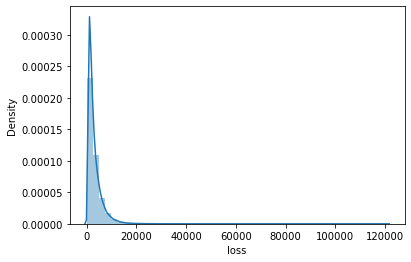

In [9]:
sns.distplot(claims_raw['loss']);

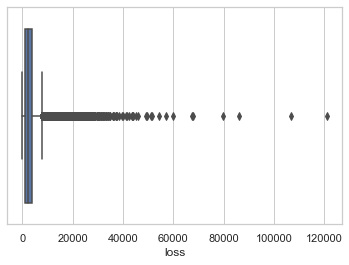

In [10]:
sns.set(style="whitegrid")
ax = sns.boxplot(x=losses_raw)

<p>Histogram and boxplot show loss column has some outliers, this is normal on insurance claims data, I decided to take off outliers after an especific percentile, in real world, all values bigger than the treshold can be assumed as reinsurance coverage</p>

In [6]:
#Obtain all values below percentile 95
q95 = losses_raw[losses_raw <= losses_raw.quantile(q = 0.95)]

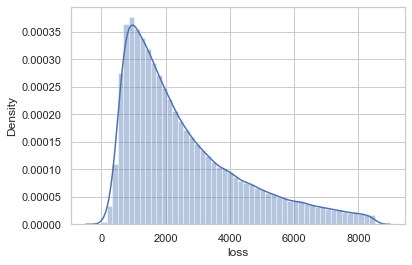

In [13]:
sns.distplot(q95);

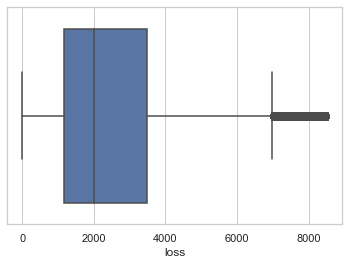

In [7]:
sns.set(style="whitegrid")
ax = sns.boxplot(x=q95)

<p>After taking off outliers above q95, target column look more suitable for a regression model, so new dataframe will only contain values below q95</p>

In [8]:
#Getting new subset of dataframe
claims_raw_q95 = claims_raw.copy()
claims_raw_q95 = claims_raw_q95[claims_raw_q95['loss'] <= claims_raw_q95['loss'].quantile(q = 0.95)]
claims_raw_q95.head()

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,...,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
0,1,A,B,A,B,A,A,A,A,B,...,0.718367,0.335060,0.30260,0.67135,0.83510,0.569745,0.594646,0.822493,0.714843,2213.18
1,2,A,B,A,A,A,A,A,A,B,...,0.438917,0.436585,0.60087,0.35127,0.43919,0.338312,0.366307,0.611431,0.304496,1283.60
2,5,A,B,A,A,B,A,A,A,B,...,0.289648,0.315545,0.27320,0.26076,0.32446,0.381398,0.373424,0.195709,0.774425,3005.09
3,10,B,B,A,B,A,A,A,A,B,...,0.440945,0.391128,0.31796,0.32128,0.44467,0.327915,0.321570,0.605077,0.602642,939.85
4,11,A,B,A,B,A,A,A,A,B,...,0.178193,0.247408,0.24564,0.22089,0.21230,0.204687,0.202213,0.246011,0.432606,2763.85


In [9]:
#reset index
claims_raw_q95.reset_index
claims_raw_q95

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,...,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
0,1,A,B,A,B,A,A,A,A,B,...,0.718367,0.335060,0.30260,0.67135,0.83510,0.569745,0.594646,0.822493,0.714843,2213.18
1,2,A,B,A,A,A,A,A,A,B,...,0.438917,0.436585,0.60087,0.35127,0.43919,0.338312,0.366307,0.611431,0.304496,1283.60
2,5,A,B,A,A,B,A,A,A,B,...,0.289648,0.315545,0.27320,0.26076,0.32446,0.381398,0.373424,0.195709,0.774425,3005.09
3,10,B,B,A,B,A,A,A,A,B,...,0.440945,0.391128,0.31796,0.32128,0.44467,0.327915,0.321570,0.605077,0.602642,939.85
4,11,A,B,A,B,A,A,A,A,B,...,0.178193,0.247408,0.24564,0.22089,0.21230,0.204687,0.202213,0.246011,0.432606,2763.85
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
188313,587620,A,B,A,A,A,A,A,A,B,...,0.242437,0.289949,0.24564,0.30859,0.32935,0.223038,0.220003,0.333292,0.208216,1198.62
188314,587624,A,A,A,A,A,B,A,A,A,...,0.334270,0.382000,0.63475,0.40455,0.47779,0.307628,0.301921,0.318646,0.305872,1108.34
188315,587630,A,B,A,A,A,A,A,B,B,...,0.345883,0.370534,0.24564,0.45808,0.47779,0.445614,0.443374,0.339244,0.503888,5762.64
188316,587632,A,B,A,A,A,A,A,A,B,...,0.704364,0.562866,0.34987,0.44767,0.53881,0.863052,0.852865,0.654753,0.721707,1562.87


<p>new dataset has 178,902 rows</p>

<h2>&#9635; EDA</h2>

<h3>&#9733; Categorical Features</h3>

In [5]:
#Getting all categorial name columns
categorical_columns = ['cat'+str(number) for number in range(1,117)]

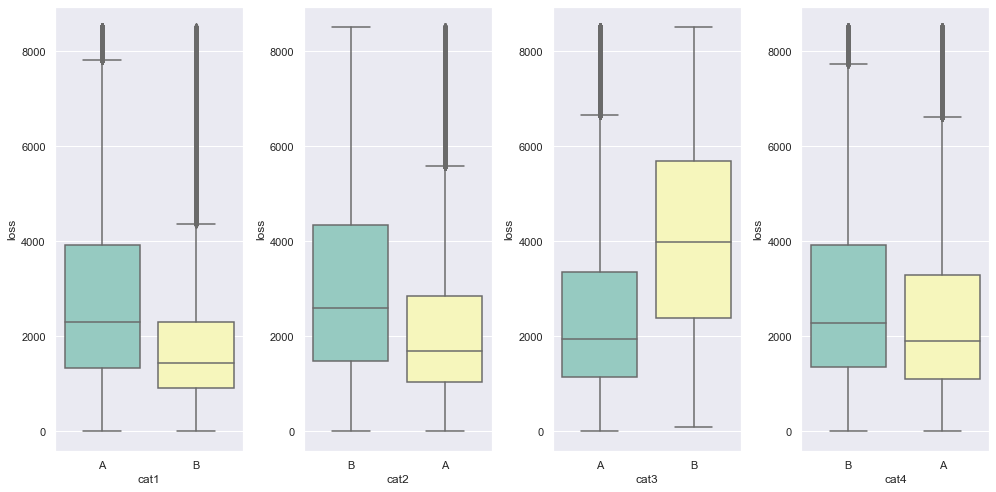

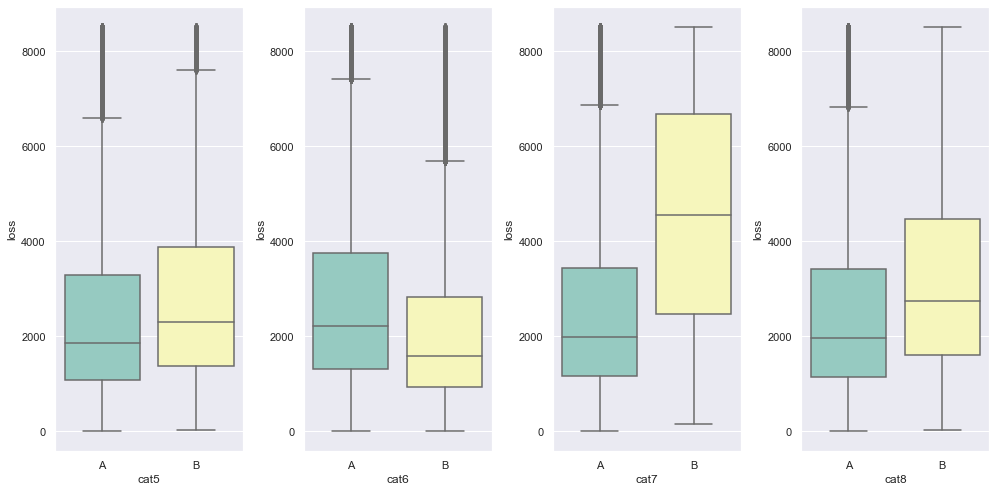

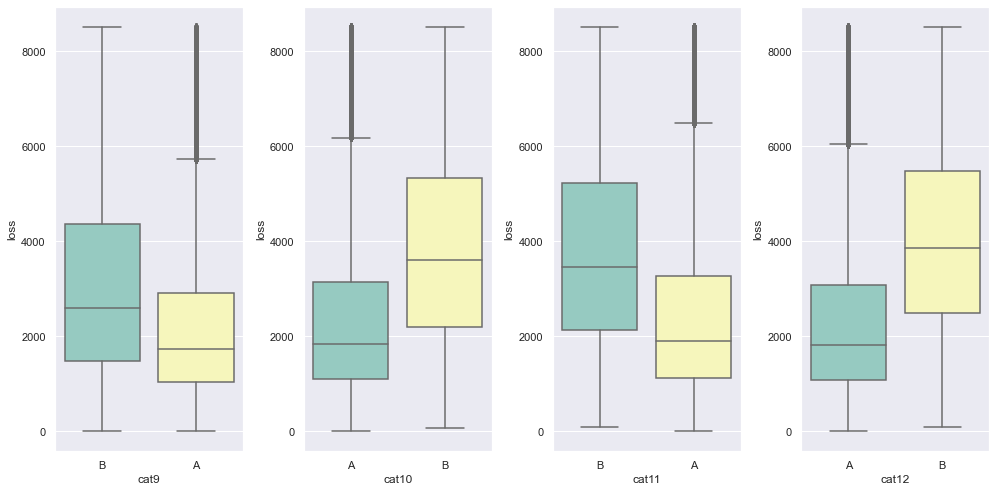

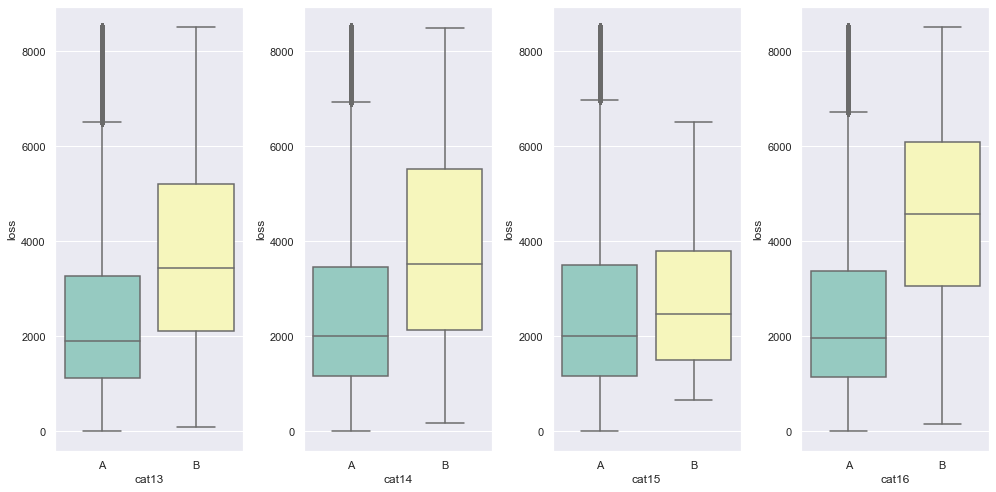

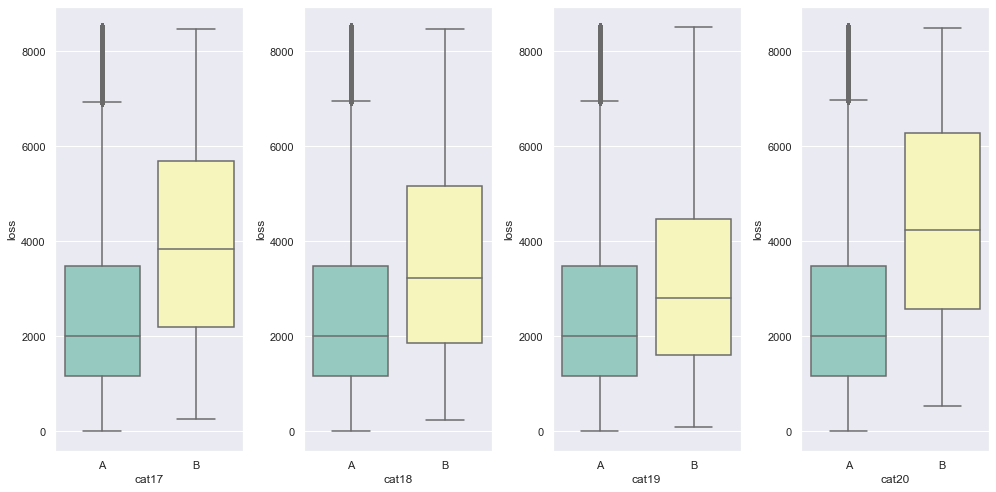

...

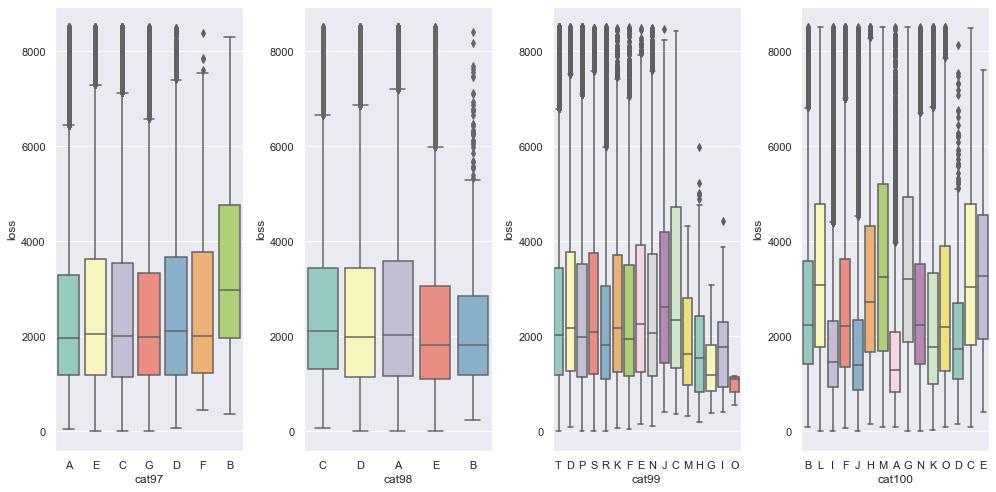

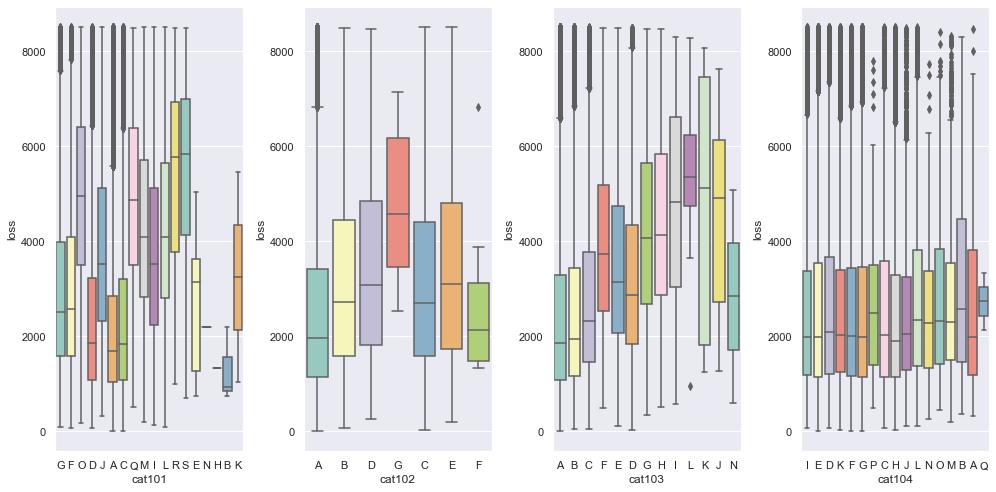

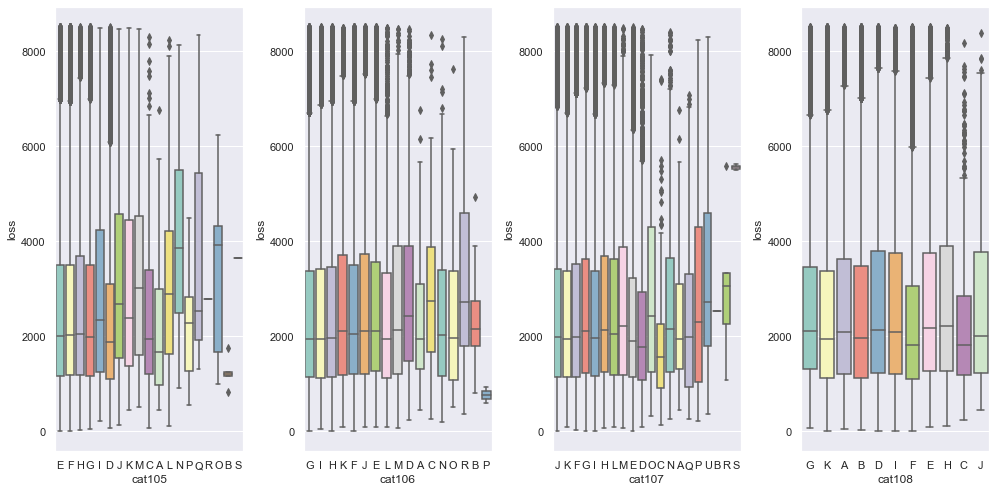

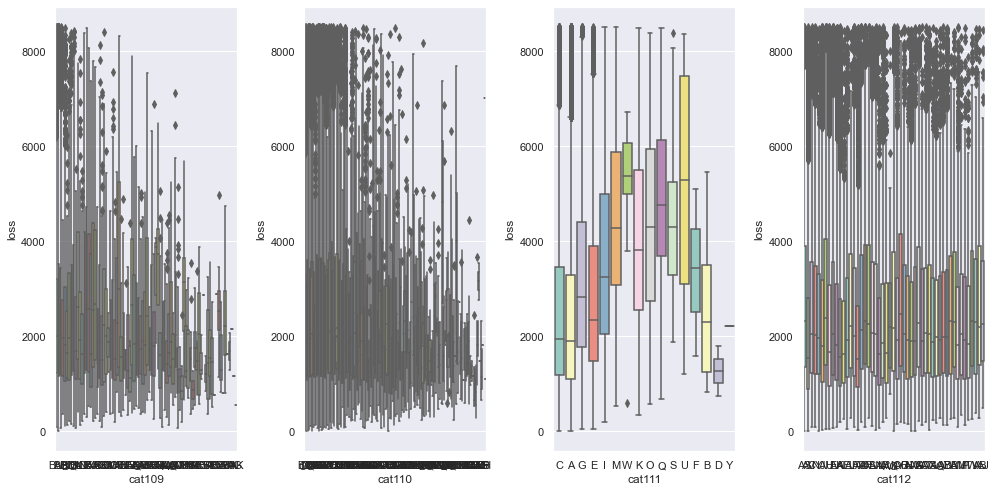

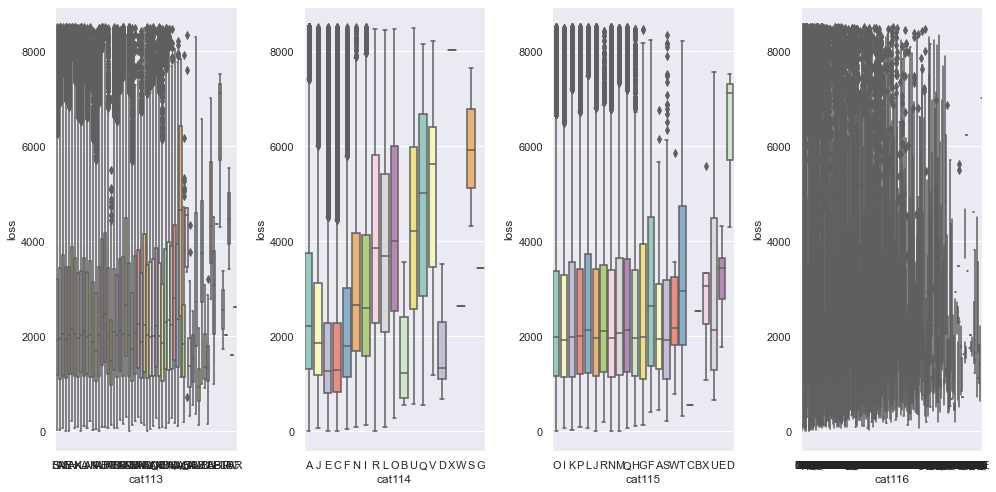

In [58]:
#Boxplot of losses divide by each categorial column
for i in range(1,114,4):
    fig = plt.figure(figsize=(14, 7))
    sns.set(style="darkgrid")
    plt.subplot(1, 4, 1)
    ax1 = sns.boxplot(x = claims_raw_q95[claims_raw_q95.columns[i]], y=claims_raw_q95['loss'], palette="Set3")
    plt.subplot(1, 4, 2)
    ax2 = sns.boxplot(x = claims_raw_q95[claims_raw_q95.columns[i + 1]], y=claims_raw_q95['loss'], palette="Set3")
    plt.subplot(1, 4, 3)
    ax3 = sns.boxplot(x = claims_raw_q95[claims_raw_q95.columns[i + 2]], y=claims_raw_q95['loss'], palette="Set3")
    plt.subplot(1, 4, 4)
    ax4 = sns.boxplot(x = claims_raw_q95[claims_raw_q95.columns[i + 3]], y=claims_raw_q95['loss'], palette="Set3")
    plt.tight_layout();

<p>Boxplots show that most categorical features have 2 categories but the rest ot them has up to 317 (cat116)</p>

In [75]:
#Count how many categories each categorical column has
categories = {}
for cat in categorical_columns:
    categories[cat] = len(claims_raw_q95[cat].unique())
categories

{'cat1': 2,
 'cat2': 2,
 'cat3': 2,
 'cat4': 2,
 'cat5': 2,
 'cat6': 2,
 'cat7': 2,
 'cat8': 2,
 'cat9': 2,
 'cat10': 2,
 'cat11': 2,
 'cat12': 2,
 'cat13': 2,
 'cat14': 2,
 'cat15': 2,
 'cat16': 2,
 'cat17': 2,
 'cat18': 2,
 'cat19': 2,
 'cat20': 2,
 'cat21': 2,
 'cat22': 2,
 'cat23': 2,
 'cat24': 2,
 'cat25': 2,
 'cat26': 2,
 'cat27': 2,
 'cat28': 2,
 'cat29': 2,
 'cat30': 2,
 'cat31': 2,
 'cat32': 2,
 'cat33': 2,
 'cat34': 2,
 'cat35': 2,
 'cat36': 2,
 'cat37': 2,
 'cat38': 2,
 'cat39': 2,
 'cat40': 2,
 'cat41': 2,
 'cat42': 2,
 'cat43': 2,
 'cat44': 2,
 'cat45': 2,
 'cat46': 2,
 'cat47': 2,
 'cat48': 2,
 'cat49': 2,
 'cat50': 2,
 'cat51': 2,
 'cat52': 2,
 'cat53': 2,
 'cat54': 2,
 'cat55': 2,
 'cat56': 2,
 'cat57': 2,
 'cat58': 2,
 'cat59': 2,
 'cat60': 2,
 'cat61': 2,
 'cat62': 2,
 'cat63': 2,
 'cat64': 2,
 'cat65': 2,
 'cat66': 2,
 'cat67': 2,
 'cat68': 2,
 'cat69': 2,
 'cat70': 2,
 'cat71': 2,
 'cat72': 2,
 'cat73': 3,
 'cat74': 3,
 'cat75': 3,
 'cat76': 3,
 'cat77': 4,
 'cat78'

<h3>&#9733; Numerical Features</h3>

In [11]:
#Get the name of numerical features
numerical_columns = ['cont'+str(number) for number in range(1,15)]

In [17]:
numerical_features = claims_raw_q95[numerical_columns]
numerical_features['loss'] = claims_raw_q95['loss']
numerical_features

,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
0,0.726300,0.245921,0.187583,0.789639,0.310061,0.718367,0.335060,0.30260,0.67135,0.83510,0.569745,0.594646,0.822493,0.714843,2213.18
1,0.330514,0.737068,0.592681,0.614134,0.885834,0.438917,0.436585,0.60087,0.35127,0.43919,0.338312,0.366307,0.611431,0.304496,1283.60
2,0.261841,0.358319,0.484196,0.236924,0.397069,0.289648,0.315545,0.27320,0.26076,0.32446,0.381398,0.373424,0.195709,0.774425,3005.09
3,0.321594,0.555782,0.527991,0.373816,0.422268,0.440945,0.391128,0.31796,0.32128,0.44467,0.327915,0.321570,0.605077,0.602642,939.85
4,0.273204,0.159990,0.527991,0.473202,0.704268,0.178193,0.247408,0.24564,0.22089,0.21230,0.204687,0.202213,0.246011,0.432606,2763.85
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
188313,0.347403,0.785784,0.613660,0.473202,0.939556,0.242437,0.289949,0.24564,0.30859,0.32935,0.223038,0.220003,0.333292,0.208216,1198.62
188314,0.507661,0.555782,0.549770,0.802892,0.704268,0.334270,0.382000,0.63475,0.40455,0.47779,0.307628,0.301921,0.318646,0.305872,1108.34
188315,0.484469,0.785784,0.792378,0.189137,0.482436,0.345883,0.370534,0.24564,0.45808,0.47779,0.445614,0.443374,0.339244,0.503888,5762.64
188316,0.438385,0.422197,0.298977,0.383428,0.340543,0.704364,0.562866,0.34987,0.44767,0.53881,0.863052,0.852865,0.654753,0.721707,1562.87


<p>Numerical column have values between 0 and 1</p>

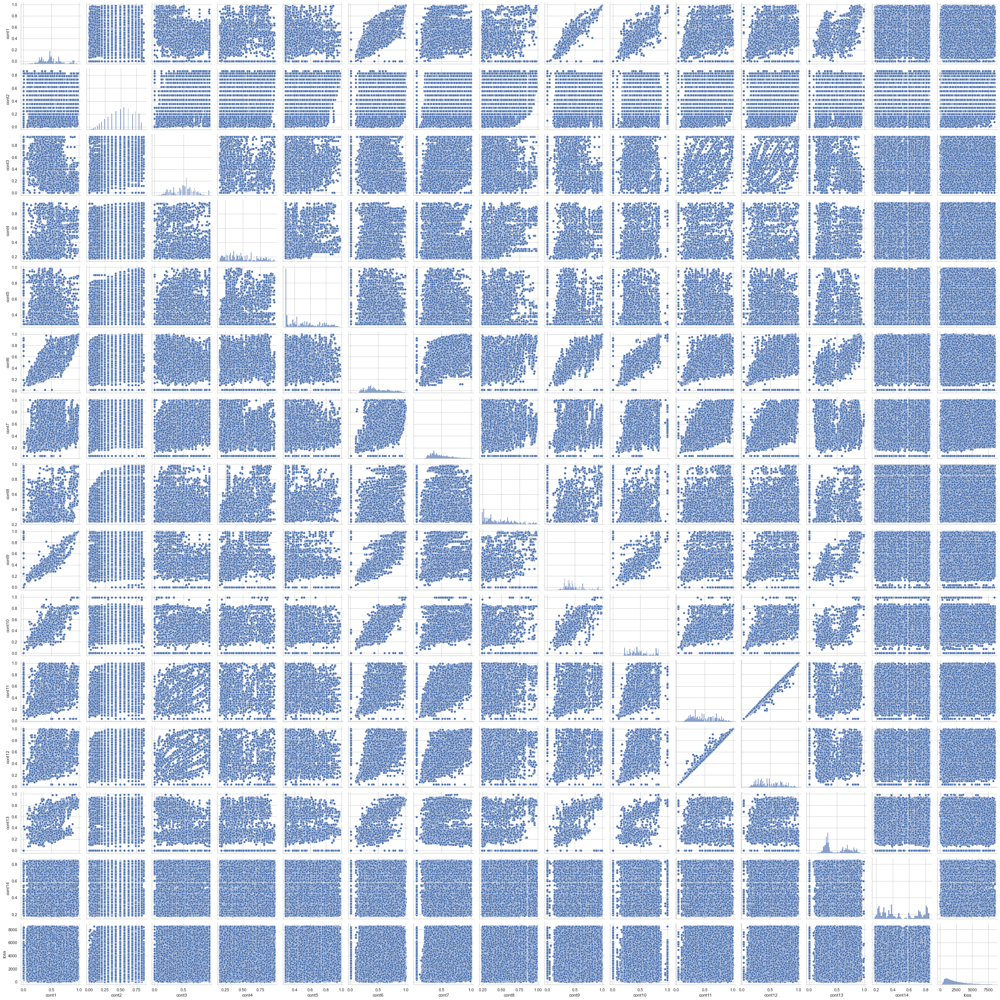

In [19]:
#Histogram and scatter plot visualizations
sns.pairplot(numerical_features)

<p>Numerical columns do not show linear relation between them and loss column</p>

In [20]:
#Correlation matriz will bring information about the interaction between variables
numerical_features.corr().style.background_gradient(cmap='coolwarm', axis=None)

,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
cont1,1.000000,-0.083156,-0.444683,0.367324,-0.027459,0.758017,0.375344,0.359892,0.929380,0.809137,0.602390,0.620333,0.531435,0.056311,-0.021185
cont2,-0.083156,1.000000,0.455452,0.040636,0.195705,0.018145,0.046039,0.139726,-0.030631,0.066337,0.117289,0.106634,0.028397,-0.045523,0.069338
cont3,-0.444683,0.455452,1.000000,-0.341097,0.096263,-0.352237,0.086299,-0.183503,-0.417307,-0.326422,0.017383,-0.001524,-0.413566,-0.039816,0.056525
cont4,0.367324,0.040636,-0.341097,1.000000,0.162416,0.222868,-0.108418,0.528222,0.328943,0.283573,0.124930,0.134121,0.176947,0.017873,-0.025008
cont5,-0.027459,0.195705,0.096263,0.162416,1.000000,-0.150944,-0.246728,0.008505,-0.090169,-0.066829,-0.149508,-0.145895,-0.087910,-0.021327,-0.002573
cont6,0.758017,0.018145,-0.352237,0.222868,-0.150944,1.000000,0.664246,0.439179,0.797865,0.883121,0.778023,0.789370,0.817287,0.042330,0.000529
cont7,0.375344,0.046039,0.086299,-0.108418,-0.246728,0.664246,1.000000,0.147255,0.390006,0.498946,0.746429,0.742283,0.301461,0.022371,0.034971
cont8,0.359892,0.139726,-0.183503,0.528222,0.008505,0.439179,0.147255,1.000000,0.452700,0.336644,0.307433,0.320781,0.478998,0.044053,0.015851
cont9,0.929380,-0.030631,-0.417307,0.328943,-0.090169,0.797865,0.390006,0.452700,1.000000,0.786472,0.613432,0.631923,0.642609,0.073650,-0.003143
cont10,0.809137,0.066337,-0.326422,0.283573,-0.066829,0.883121,0.498946,0.336644,0.786472,1.000000,0.707568,0.718350,0.706936,0.041468,-0.014220


<h2>&#9635; Saving data</h2>

<p>Before modelling, it is a good practice to save the data withall changes to get a quick access</p>

In [21]:
#Saveing new dataset
claims_raw_q95.to_csv('claims_raw_q95.csv', sep = ',', index = False)

<h2>&#9635; Feature Engineering</h2>

<h3>&#9733; Get dummies variables</h3>
<p>Dummies variables will be create using categories on Categorical Features</p>


In [34]:
claims_raw_q95_dummies = pd.get_dummies(claims_raw_q95, columns = categorical_columns,drop_first=True)
claims_raw_q95_dummies.head()

,id,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,...,cat116_MW,cat116_O,cat116_Q,cat116_R,cat116_S,cat116_T,cat116_U,cat116_V,cat116_X,cat116_Y
0,1,0.726300,0.245921,0.187583,0.789639,0.310061,0.718367,0.335060,0.30260,0.67135,...,0,0,0,0,0,0,0,0,0,0
1,2,0.330514,0.737068,0.592681,0.614134,0.885834,0.438917,0.436585,0.60087,0.35127,...,0,0,0,0,0,0,0,0,0,0
2,5,0.261841,0.358319,0.484196,0.236924,0.397069,0.289648,0.315545,0.27320,0.26076,...,0,0,0,0,0,0,0,0,0,0
3,10,0.321594,0.555782,0.527991,0.373816,0.422268,0.440945,0.391128,0.31796,0.32128,...,0,0,0,0,0,0,0,0,0,0
4,11,0.273204,0.159990,0.527991,0.473202,0.704268,0.178193,0.247408,0.24564,0.22089,...,0,0,0,0,0,0,0,0,0,0


In [35]:
claims_raw_q95_dummies.shape

(178902, 1024)

<h2>&#9635;Get data sets for training and testing </h2>
<p> 2 data sets will be obtained using <strong>claims_raw_q95_dummies</strong><p>
<p>Also a logarithm transformation will be perform in order to get lower coefficients and be able to do a further analysis and log transformation is a widely used method to address skewed data<p>    

In [36]:
loss = claims_raw_q95_dummies['loss']
claims = claims_raw_q95_dummies.drop(columns = ['id','loss']) 
# Log Transformation
# Add 1 to get just positive values for further coefficients analysis
log_loss = np.log(loss) + np.full_like(loss, fill_value = 1)

<h2>&#9635;Split Datasets</h2>

In [37]:
X_train, X_test, y_train, y_test = train_test_split(claims,log_loss, test_size = 0.25, random_state=1988)
print("X_train shape is: {}".format(X_train.shape))
print("y_train shape is: {}".format(y_train.shape))
print("X_test shape is: {}".format(X_test.shape))
print("y_test shape is: {}".format(y_test.shape))

X_train shape is: (134176, 1022)
y_train shape is: (134176,)
X_test shape is: (44726, 1022)
y_test shape is: (44726,)


<h2>&#9635; Scores Function</h2>
<p> General function that provides scores such as:</p>
<ul>
  <li>MAE = Mean Absolute Error</li>
  <li>MSE = Mean Squared Error</li>
  <li>R2 - Score</li>
  <li>R2 - Adjusted</li>
</ul> 

In [38]:
#Function to get scores from Regression algorithms
def score(model,X,y):
    model = model
    model.fit(X, y)
    pred = model.predict(X)
    r2_adjusted = 1 - (1 - r2_score(y, pred))*(len(y)-1)/(len(y)-X.shape[1]-1)
    
    #Print scores for model selected
    print("MAE is: {}".format(mean_absolute_error(y,pred)))
    print("MSE is: {}".format(mean_squared_error(y,pred)))
    print("R2 score is: {}".format(r2_score(y, pred)))
    print("R2 adjusted is: {}".format(r2_adjusted))

<h2>&#9635; Model Selection</h2>

<h3>&#9733; Linear Reggresion</h3>

In [49]:
lr = LinearRegression()
score(lr,X_train,y_train)

MAE is: 0.42511612110790553
MSE is: 0.29392748852161515
R2 score is: 0.4507096322849653
R2 adjusted is: 0.4464936194590826


<h3>&#9733; Lasso Reggresion</h3>
<p>Is a type of linear regression that uses shrinkage. Shrinkage is where data values are shrunk towards a central point, like the mean.</p>

In [56]:
lasso = linear_model.Lasso(alpha = 0.5)
score(lasso,X_train,y_train)

MAE is: 0.6033854941837159
MSE is: 0.5351040283926866
R2 score is: 0.0
R2 adjusted is: -0.007675380952738564


<h3>&#9733; Ridge Reggresion</h3>
<p>Is a method of estimating the coefficients of multiple-regression models in scenarios where linearly independent variables are highly correlated</p>

In [60]:
rr = linear_model.Ridge(alpha = 0.1)
score(rr,X_train,y_train)

MAE is: 0.42518075314346676
MSE is: 0.2939136828008765
R2 score is: 0.45073543235374847
R2 adjusted is: 0.44651961755322234


<h3>&#9733; Desicion Tree Reggresion</h3>

In [54]:
for depth in [2,5,10]:
    dtr = DecisionTreeRegressor(max_depth=depth)
    print('Scores for Desicion Tree Reggresion of depth {} \n'.format(depth))
    score(dtr,X_train,y_train)
    print('\n')

Scores for Desicion Tree Reggresion of depth 2 

MAE is: 0.5183648688945556
MSE is: 0.41705587502480657
R2 score is: 0.22060785773275882
R2 adjusted is: 0.21462572612928676


Scores for Desicion Tree Reggresion of depth 5 

MAE is: 0.48638201329063857
MSE is: 0.3741262497386851
R2 score is: 0.30083454826071265
R2 adjusted is: 0.2954681870696201


Scores for Desicion Tree Reggresion of depth 10 

MAE is: 0.44221543522215223
MSE is: 0.31927050217023784
R2 score is: 0.403348722435816
R2 adjusted is: 0.39876919658457266




<h3>&#9733; ElasticNet</h3>
<p>Elastic Net is an extension of linear regression that adds regularization penalties to the loss function during training.</p>

In [63]:
EN = linear_model.ElasticNet()
score(EN,X_train,y_train)

MAE is: 0.6033854941837159
MSE is: 0.5351040283926866
R2 score is: 0.0
R2 adjusted is: -0.007675380952738564


<h3>&#9733; Bayesian Ridge</h3>
<p>is an approach to linear regression in which the statistical analysis is undertaken within the context of Bayesian inference</p>

In [64]:
br = linear_model.BayesianRidge()
score(br,X_train,y_train)

MAE is: 0.426119445073119
MSE is: 0.2950017296567588
R2 score is: 0.44870209528628036
R2 adjusted is: 0.44447067384915595


<h3>&#9733; Stochastic Gradient Descent</h3>
<p>Model repeatedly runs through the training set one data point at a a time and update the parameters according to the gradient of the error with respect to each individual data point.</p>

In [65]:
SGD = SGDRegressor()
score(SGD,X_train,y_train)

MAE is: 0.4288239134434369
MSE is: 0.2994032605045776
R2 score is: 0.44047653424716837
R2 adjusted is: 0.4361819784955189


<h3>&#9733; LightGBM Regressor</h3>
<p>Is a gradient boosting framework based on decision trees to increases the efficiency of the model and reduces memory usage.</p>

In [61]:
LGBM = ltb.LGBMRegressor()
score(LGBM,X_train,y_train)

MAE is: 0.40354279509455626
MSE is: 0.2678692832747535
R2 score is: 0.499407088974151
R2 adjusted is: 0.49556484767978726


<h3>&#9733; Gradient boosting Regressor</h3>
<p>It gives a prediction model in the form of an ensemble of weak prediction models, which are typically decision trees..</p>

In [62]:
GBR = GradientBoostingRegressor()
score(GBR,X_train,y_train)

MAE is: 0.4292585861676095
MSE is: 0.2974108334691366
R2 score is: 0.44419997292399116
R2 adjusted is: 0.4399339959826404


<h3>&#9733; XGB Regressor</h3>
<p>XGBoost minimizes a regularized (L1 and L2) objective function that combines a convex loss function</p>

In [67]:
XGBR = XGBRegressor()
score(XGBR,X_train,y_train)

MAE is: 0.38561347564831683
MSE is: 0.24365233895415533
R2 score is: 0.5446636055310148
R2 adjusted is: 0.5411687252418189


<h3>&#9733; CatBoost Regressor</h3>
<p>Allow to work with Ctegorical data without encoding</p>

In [39]:
catboost = CatBoostRegressor()
score(catboost,X_train,y_train)

Learning rate set to 0.088788
0:	learn: 0.7132739	total: 581ms	remaining: 9m 40s
1:	learn: 0.6978959	total: 669ms	remaining: 5m 33s
2:	learn: 0.6843721	total: 724ms	remaining: 4m
3:	learn: 0.6726226	total: 780ms	remaining: 3m 14s
4:	learn: 0.6626575	total: 833ms	remaining: 2m 45s
5:	learn: 0.6537891	total: 873ms	remaining: 2m 24s
6:	learn: 0.6457419	total: 917ms	remaining: 2m 10s
7:	learn: 0.6383773	total: 957ms	remaining: 1m 58s
8:	learn: 0.6319883	total: 1000ms	remaining: 1m 50s
9:	learn: 0.6265675	total: 1.05s	remaining: 1m 43s
10:	learn: 0.6210844	total: 1.12s	remaining: 1m 40s
11:	learn: 0.6165476	total: 1.16s	remaining: 1m 35s
12:	learn: 0.6123994	total: 1.2s	remaining: 1m 31s
13:	learn: 0.6085430	total: 1.25s	remaining: 1m 27s
14:	learn: 0.6048862	total: 1.29s	remaining: 1m 25s
15:	learn: 0.6015038	total: 1.34s	remaining: 1m 22s
16:	learn: 0.5984894	total: 1.38s	remaining: 1m 19s
17:	learn: 0.5958496	total: 1.42s	remaining: 1m 17s
18:	learn: 0.5934851	total: 1.47s	remaining: 1m 

162:	learn: 0.5308783	total: 8.48s	remaining: 43.5s
163:	learn: 0.5307656	total: 8.52s	remaining: 43.4s
164:	learn: 0.5306006	total: 8.55s	remaining: 43.3s
165:	learn: 0.5304981	total: 8.59s	remaining: 43.2s
166:	learn: 0.5303909	total: 8.63s	remaining: 43.1s
167:	learn: 0.5302928	total: 8.67s	remaining: 43s
168:	learn: 0.5301922	total: 8.73s	remaining: 42.9s
169:	learn: 0.5301090	total: 8.79s	remaining: 42.9s
170:	learn: 0.5300106	total: 8.84s	remaining: 42.9s
171:	learn: 0.5298428	total: 8.89s	remaining: 42.8s
172:	learn: 0.5297428	total: 8.93s	remaining: 42.7s
173:	learn: 0.5296469	total: 8.97s	remaining: 42.6s
174:	learn: 0.5295553	total: 9.01s	remaining: 42.5s
175:	learn: 0.5294759	total: 9.05s	remaining: 42.4s
176:	learn: 0.5293745	total: 9.09s	remaining: 42.3s
177:	learn: 0.5292949	total: 9.12s	remaining: 42.1s
178:	learn: 0.5292190	total: 9.17s	remaining: 42.1s
179:	learn: 0.5291261	total: 9.21s	remaining: 41.9s
180:	learn: 0.5290299	total: 9.25s	remaining: 41.8s
181:	learn: 0.

323:	learn: 0.5202792	total: 15.8s	remaining: 33s
324:	learn: 0.5202370	total: 15.9s	remaining: 33s
325:	learn: 0.5202035	total: 15.9s	remaining: 32.9s
326:	learn: 0.5201642	total: 15.9s	remaining: 32.8s
327:	learn: 0.5201175	total: 16s	remaining: 32.8s
328:	learn: 0.5200844	total: 16s	remaining: 32.7s
329:	learn: 0.5200343	total: 16.1s	remaining: 32.7s
330:	learn: 0.5199875	total: 16.1s	remaining: 32.6s
331:	learn: 0.5199520	total: 16.2s	remaining: 32.5s
332:	learn: 0.5199041	total: 16.2s	remaining: 32.4s
333:	learn: 0.5198456	total: 16.2s	remaining: 32.4s
334:	learn: 0.5197994	total: 16.3s	remaining: 32.3s
335:	learn: 0.5197821	total: 16.3s	remaining: 32.2s
336:	learn: 0.5197454	total: 16.3s	remaining: 32.2s
337:	learn: 0.5197141	total: 16.4s	remaining: 32.1s
338:	learn: 0.5196703	total: 16.4s	remaining: 32.1s
339:	learn: 0.5196672	total: 16.5s	remaining: 32s
340:	learn: 0.5196129	total: 16.5s	remaining: 31.9s
341:	learn: 0.5195623	total: 16.6s	remaining: 31.9s
342:	learn: 0.5195329	

486:	learn: 0.5144964	total: 22.9s	remaining: 24.2s
487:	learn: 0.5144640	total: 23s	remaining: 24.1s
488:	learn: 0.5144402	total: 23s	remaining: 24s
489:	learn: 0.5144147	total: 23s	remaining: 24s
490:	learn: 0.5143814	total: 23.1s	remaining: 23.9s
491:	learn: 0.5143417	total: 23.1s	remaining: 23.9s
492:	learn: 0.5143236	total: 23.2s	remaining: 23.8s
493:	learn: 0.5142852	total: 23.2s	remaining: 23.8s
494:	learn: 0.5142560	total: 23.3s	remaining: 23.7s
495:	learn: 0.5142477	total: 23.3s	remaining: 23.7s
496:	learn: 0.5142285	total: 23.3s	remaining: 23.6s
497:	learn: 0.5141969	total: 23.4s	remaining: 23.6s
498:	learn: 0.5141655	total: 23.5s	remaining: 23.6s
499:	learn: 0.5141337	total: 23.6s	remaining: 23.6s
500:	learn: 0.5141079	total: 23.7s	remaining: 23.6s
501:	learn: 0.5140831	total: 23.8s	remaining: 23.6s
502:	learn: 0.5140813	total: 23.8s	remaining: 23.5s
503:	learn: 0.5140465	total: 23.8s	remaining: 23.5s
504:	learn: 0.5140034	total: 23.9s	remaining: 23.4s
505:	learn: 0.5139576	

647:	learn: 0.5101626	total: 30.3s	remaining: 16.5s
648:	learn: 0.5101398	total: 30.4s	remaining: 16.4s
649:	learn: 0.5101162	total: 30.4s	remaining: 16.4s
650:	learn: 0.5100900	total: 30.5s	remaining: 16.3s
651:	learn: 0.5100780	total: 30.5s	remaining: 16.3s
652:	learn: 0.5100548	total: 30.6s	remaining: 16.2s
653:	learn: 0.5100241	total: 30.6s	remaining: 16.2s
654:	learn: 0.5100047	total: 30.6s	remaining: 16.1s
655:	learn: 0.5099755	total: 30.7s	remaining: 16.1s
656:	learn: 0.5099473	total: 30.7s	remaining: 16s
657:	learn: 0.5099216	total: 30.8s	remaining: 16s
658:	learn: 0.5098930	total: 30.8s	remaining: 15.9s
659:	learn: 0.5098723	total: 30.9s	remaining: 15.9s
660:	learn: 0.5098520	total: 30.9s	remaining: 15.8s
661:	learn: 0.5098385	total: 30.9s	remaining: 15.8s
662:	learn: 0.5098119	total: 31s	remaining: 15.7s
663:	learn: 0.5097721	total: 31s	remaining: 15.7s
664:	learn: 0.5097530	total: 31.1s	remaining: 15.6s
665:	learn: 0.5097403	total: 31.1s	remaining: 15.6s
666:	learn: 0.509717

809:	learn: 0.5067416	total: 37.5s	remaining: 8.79s
810:	learn: 0.5067196	total: 37.5s	remaining: 8.74s
811:	learn: 0.5066890	total: 37.6s	remaining: 8.69s
812:	learn: 0.5066746	total: 37.6s	remaining: 8.65s
813:	learn: 0.5066459	total: 37.7s	remaining: 8.6s
814:	learn: 0.5066335	total: 37.7s	remaining: 8.56s
815:	learn: 0.5065972	total: 37.7s	remaining: 8.51s
816:	learn: 0.5065804	total: 37.8s	remaining: 8.46s
817:	learn: 0.5065572	total: 37.8s	remaining: 8.41s
818:	learn: 0.5065353	total: 37.9s	remaining: 8.37s
819:	learn: 0.5065099	total: 37.9s	remaining: 8.32s
820:	learn: 0.5064881	total: 37.9s	remaining: 8.27s
821:	learn: 0.5064686	total: 38s	remaining: 8.22s
822:	learn: 0.5064406	total: 38s	remaining: 8.18s
823:	learn: 0.5064082	total: 38.1s	remaining: 8.13s
824:	learn: 0.5063988	total: 38.1s	remaining: 8.08s
825:	learn: 0.5063700	total: 38.1s	remaining: 8.03s
826:	learn: 0.5063459	total: 38.2s	remaining: 7.99s
827:	learn: 0.5063176	total: 38.2s	remaining: 7.94s
828:	learn: 0.506

970:	learn: 0.5034000	total: 44.3s	remaining: 1.32s
971:	learn: 0.5033884	total: 44.4s	remaining: 1.28s
972:	learn: 0.5033714	total: 44.4s	remaining: 1.23s
973:	learn: 0.5033599	total: 44.5s	remaining: 1.19s
974:	learn: 0.5033430	total: 44.5s	remaining: 1.14s
975:	learn: 0.5033178	total: 44.5s	remaining: 1.09s
976:	learn: 0.5033039	total: 44.6s	remaining: 1.05s
977:	learn: 0.5032727	total: 44.6s	remaining: 1s
978:	learn: 0.5032428	total: 44.7s	remaining: 958ms
979:	learn: 0.5032249	total: 44.7s	remaining: 913ms
980:	learn: 0.5032081	total: 44.8s	remaining: 867ms
981:	learn: 0.5031877	total: 44.8s	remaining: 821ms
982:	learn: 0.5031604	total: 44.9s	remaining: 776ms
983:	learn: 0.5031347	total: 44.9s	remaining: 730ms
984:	learn: 0.5031255	total: 45s	remaining: 685ms
985:	learn: 0.5031035	total: 45s	remaining: 639ms
986:	learn: 0.5030712	total: 45s	remaining: 593ms
987:	learn: 0.5030587	total: 45.1s	remaining: 547ms
988:	learn: 0.5030390	total: 45.1s	remaining: 502ms
989:	learn: 0.5030148

<h2>&#9635; Scores Table</h2>
<p>Let's compare scores for all models together</p>

In [130]:
score_table = pd.read_csv('scores.csv', index_col = 0)
score_table

,MAE,MSE,R2 Score,R2 adjusted
Model,,,,
Linear Reggresion,0.425116,0.293927,0.450710,0.446494
Lasso Reggresion,0.603385,0.535104,0.000000,0.000000
Ridge Reggresion,0.425181,0.293914,0.450735,0.446520
Desicion Tree Reggresion,0.442215,0.319271,0.403349,0.398769
ElasticNet,0.603385,0.535104,0.000000,0.000000
Bayesian Ridge,0.426119,0.295002,0.448702,0.444471
Stochastic Gradient Descent,0.428824,0.299403,0.440477,0.436182
LightGBM Regressor,0.403543,0.267869,0.499407,0.495565
Gradient boosting Regressor,0.429259,0.297411,0.444200,0.439934


<p>Looking at scores, there are 3 finalist:</p>
<ul>
    <li>LightGBM Regressor</li>
    <li>XGB Regressor</li>
    <li>CatBoost Regressor</li>
</ul>    

<h2>&#9635; Cross Validation</h2>
<p>Estimate how the model is expected to perform in general when used to make predictions on data not used during the training of the model.</p>

<h3>&#9733; LightGBM Regressor</h3>

In [125]:
scores = cross_val_score(LGBM, X_train, y_train, cv=5)
scores

array([0.48684324, 0.47763502, 0.483751  , 0.48640767, 0.48259533])

<h3>&#9733; XGB Regressor</h3>

In [122]:
scores = cross_val_score(XGBR, X_train, y_train, cv=5)
scores

array([0.47970722, 0.46817705, 0.47817233, 0.47983169, 0.47671683])

<h3>&#9733; CatBoost Regressor</h3>

In [127]:
scores = cross_val_score(catboost, X_train, y_train, cv=5)
scores

Learning rate set to 0.085712
0:	learn: 0.7138284	total: 342ms	remaining: 5m 41s
1:	learn: 0.6988458	total: 417ms	remaining: 3m 28s
2:	learn: 0.6857021	total: 453ms	remaining: 2m 30s
3:	learn: 0.6744355	total: 489ms	remaining: 2m 1s
4:	learn: 0.6647433	total: 524ms	remaining: 1m 44s
5:	learn: 0.6558149	total: 561ms	remaining: 1m 32s
6:	learn: 0.6481382	total: 613ms	remaining: 1m 26s
7:	learn: 0.6400637	total: 658ms	remaining: 1m 21s
8:	learn: 0.6338542	total: 701ms	remaining: 1m 17s
9:	learn: 0.6281258	total: 744ms	remaining: 1m 13s
10:	learn: 0.6232136	total: 795ms	remaining: 1m 11s
11:	learn: 0.6183228	total: 834ms	remaining: 1m 8s
12:	learn: 0.6144372	total: 874ms	remaining: 1m 6s
13:	learn: 0.6101630	total: 922ms	remaining: 1m 4s
14:	learn: 0.6069708	total: 966ms	remaining: 1m 3s
15:	learn: 0.6035886	total: 1.01s	remaining: 1m 2s
16:	learn: 0.6005917	total: 1.06s	remaining: 1m 1s
17:	learn: 0.5978775	total: 1.1s	remaining: 60s
18:	learn: 0.5950090	total: 1.14s	remaining: 59s
19:	le

165:	learn: 0.5309684	total: 6.95s	remaining: 34.9s
166:	learn: 0.5308380	total: 6.99s	remaining: 34.9s
167:	learn: 0.5306568	total: 7.03s	remaining: 34.8s
168:	learn: 0.5305467	total: 7.06s	remaining: 34.7s
169:	learn: 0.5303996	total: 7.1s	remaining: 34.7s
170:	learn: 0.5303036	total: 7.13s	remaining: 34.6s
171:	learn: 0.5302052	total: 7.17s	remaining: 34.5s
172:	learn: 0.5301235	total: 7.21s	remaining: 34.5s
173:	learn: 0.5299719	total: 7.24s	remaining: 34.4s
174:	learn: 0.5298931	total: 7.28s	remaining: 34.3s
175:	learn: 0.5298307	total: 7.31s	remaining: 34.2s
176:	learn: 0.5298128	total: 7.34s	remaining: 34.1s
177:	learn: 0.5297185	total: 7.37s	remaining: 34s
178:	learn: 0.5296190	total: 7.4s	remaining: 34s
179:	learn: 0.5295522	total: 7.43s	remaining: 33.9s
180:	learn: 0.5294463	total: 7.46s	remaining: 33.8s
181:	learn: 0.5293626	total: 7.49s	remaining: 33.7s
182:	learn: 0.5292476	total: 7.53s	remaining: 33.6s
183:	learn: 0.5291409	total: 7.56s	remaining: 33.5s
184:	learn: 0.5291

324:	learn: 0.5203969	total: 12.3s	remaining: 25.5s
325:	learn: 0.5203561	total: 12.3s	remaining: 25.5s
326:	learn: 0.5203531	total: 12.3s	remaining: 25.4s
327:	learn: 0.5202981	total: 12.4s	remaining: 25.4s
328:	learn: 0.5202413	total: 12.4s	remaining: 25.3s
329:	learn: 0.5201984	total: 12.4s	remaining: 25.3s
330:	learn: 0.5201550	total: 12.5s	remaining: 25.2s
331:	learn: 0.5201172	total: 12.5s	remaining: 25.2s
332:	learn: 0.5200656	total: 12.5s	remaining: 25.1s
333:	learn: 0.5200189	total: 12.6s	remaining: 25.1s
334:	learn: 0.5199497	total: 12.6s	remaining: 25s
335:	learn: 0.5198931	total: 12.6s	remaining: 25s
336:	learn: 0.5198646	total: 12.7s	remaining: 24.9s
337:	learn: 0.5198183	total: 12.7s	remaining: 24.9s
338:	learn: 0.5197613	total: 12.7s	remaining: 24.8s
339:	learn: 0.5197097	total: 12.8s	remaining: 24.8s
340:	learn: 0.5196445	total: 12.8s	remaining: 24.8s
341:	learn: 0.5195928	total: 12.8s	remaining: 24.7s
342:	learn: 0.5195587	total: 12.9s	remaining: 24.7s
343:	learn: 0.51

483:	learn: 0.5141596	total: 17.8s	remaining: 19s
484:	learn: 0.5141186	total: 17.9s	remaining: 19s
485:	learn: 0.5140880	total: 17.9s	remaining: 18.9s
486:	learn: 0.5140560	total: 18s	remaining: 18.9s
487:	learn: 0.5140136	total: 18s	remaining: 18.9s
488:	learn: 0.5139830	total: 18s	remaining: 18.8s
489:	learn: 0.5139451	total: 18.1s	remaining: 18.8s
490:	learn: 0.5139431	total: 18.1s	remaining: 18.7s
491:	learn: 0.5139049	total: 18.1s	remaining: 18.7s
492:	learn: 0.5138709	total: 18.1s	remaining: 18.7s
493:	learn: 0.5138415	total: 18.2s	remaining: 18.6s
494:	learn: 0.5138131	total: 18.2s	remaining: 18.6s
495:	learn: 0.5137772	total: 18.2s	remaining: 18.5s
496:	learn: 0.5137672	total: 18.3s	remaining: 18.5s
497:	learn: 0.5137419	total: 18.3s	remaining: 18.5s
498:	learn: 0.5137162	total: 18.3s	remaining: 18.4s
499:	learn: 0.5136852	total: 18.4s	remaining: 18.4s
500:	learn: 0.5136600	total: 18.4s	remaining: 18.3s
501:	learn: 0.5136077	total: 18.4s	remaining: 18.3s
502:	learn: 0.5135851	

645:	learn: 0.5091818	total: 23.1s	remaining: 12.7s
646:	learn: 0.5091802	total: 23.1s	remaining: 12.6s
647:	learn: 0.5091513	total: 23.2s	remaining: 12.6s
648:	learn: 0.5091171	total: 23.2s	remaining: 12.6s
649:	learn: 0.5090822	total: 23.3s	remaining: 12.5s
650:	learn: 0.5090476	total: 23.3s	remaining: 12.5s
651:	learn: 0.5090213	total: 23.3s	remaining: 12.4s
652:	learn: 0.5089712	total: 23.4s	remaining: 12.4s
653:	learn: 0.5089440	total: 23.4s	remaining: 12.4s
654:	learn: 0.5089424	total: 23.4s	remaining: 12.3s
655:	learn: 0.5089216	total: 23.4s	remaining: 12.3s
656:	learn: 0.5088905	total: 23.5s	remaining: 12.3s
657:	learn: 0.5088618	total: 23.5s	remaining: 12.2s
658:	learn: 0.5088204	total: 23.5s	remaining: 12.2s
659:	learn: 0.5087788	total: 23.6s	remaining: 12.1s
660:	learn: 0.5087576	total: 23.6s	remaining: 12.1s
661:	learn: 0.5087544	total: 23.6s	remaining: 12.1s
662:	learn: 0.5087234	total: 23.7s	remaining: 12s
663:	learn: 0.5086948	total: 23.7s	remaining: 12s
664:	learn: 0.50

808:	learn: 0.5049803	total: 28.4s	remaining: 6.7s
809:	learn: 0.5049636	total: 28.4s	remaining: 6.67s
810:	learn: 0.5049139	total: 28.5s	remaining: 6.63s
811:	learn: 0.5048905	total: 28.5s	remaining: 6.59s
812:	learn: 0.5048574	total: 28.5s	remaining: 6.56s
813:	learn: 0.5048436	total: 28.5s	remaining: 6.52s
814:	learn: 0.5048106	total: 28.6s	remaining: 6.49s
815:	learn: 0.5047673	total: 28.6s	remaining: 6.45s
816:	learn: 0.5047419	total: 28.6s	remaining: 6.42s
817:	learn: 0.5047405	total: 28.7s	remaining: 6.38s
818:	learn: 0.5047156	total: 28.7s	remaining: 6.34s
819:	learn: 0.5046992	total: 28.7s	remaining: 6.3s
820:	learn: 0.5046695	total: 28.8s	remaining: 6.27s
821:	learn: 0.5046573	total: 28.8s	remaining: 6.24s
822:	learn: 0.5046342	total: 28.8s	remaining: 6.2s
823:	learn: 0.5046040	total: 28.9s	remaining: 6.17s
824:	learn: 0.5045857	total: 28.9s	remaining: 6.13s
825:	learn: 0.5045740	total: 28.9s	remaining: 6.09s
826:	learn: 0.5045475	total: 29s	remaining: 6.06s
827:	learn: 0.504

968:	learn: 0.5012133	total: 34s	remaining: 1.09s
969:	learn: 0.5011905	total: 34s	remaining: 1.05s
970:	learn: 0.5011751	total: 34s	remaining: 1.02s
971:	learn: 0.5011443	total: 34.1s	remaining: 982ms
972:	learn: 0.5011108	total: 34.1s	remaining: 947ms
973:	learn: 0.5010976	total: 34.1s	remaining: 911ms
974:	learn: 0.5010553	total: 34.2s	remaining: 876ms
975:	learn: 0.5010270	total: 34.2s	remaining: 841ms
976:	learn: 0.5010068	total: 34.2s	remaining: 806ms
977:	learn: 0.5009866	total: 34.3s	remaining: 771ms
978:	learn: 0.5009534	total: 34.3s	remaining: 736ms
979:	learn: 0.5009160	total: 34.3s	remaining: 701ms
980:	learn: 0.5008987	total: 34.4s	remaining: 666ms
981:	learn: 0.5008738	total: 34.4s	remaining: 631ms
982:	learn: 0.5008448	total: 34.4s	remaining: 596ms
983:	learn: 0.5008164	total: 34.5s	remaining: 561ms
984:	learn: 0.5007908	total: 34.5s	remaining: 525ms
985:	learn: 0.5007721	total: 34.5s	remaining: 490ms
986:	learn: 0.5007338	total: 34.6s	remaining: 455ms
987:	learn: 0.5007

130:	learn: 0.5337066	total: 4.86s	remaining: 32.2s
131:	learn: 0.5335230	total: 4.89s	remaining: 32.2s
132:	learn: 0.5333828	total: 4.92s	remaining: 32.1s
133:	learn: 0.5332805	total: 4.96s	remaining: 32s
134:	learn: 0.5331397	total: 4.99s	remaining: 32s
135:	learn: 0.5330560	total: 5.03s	remaining: 31.9s
136:	learn: 0.5329183	total: 5.07s	remaining: 31.9s
137:	learn: 0.5327556	total: 5.1s	remaining: 31.9s
138:	learn: 0.5326490	total: 5.13s	remaining: 31.8s
139:	learn: 0.5325244	total: 5.17s	remaining: 31.7s
140:	learn: 0.5323928	total: 5.2s	remaining: 31.7s
141:	learn: 0.5322625	total: 5.24s	remaining: 31.6s
142:	learn: 0.5320309	total: 5.28s	remaining: 31.6s
143:	learn: 0.5319109	total: 5.31s	remaining: 31.6s
144:	learn: 0.5318059	total: 5.34s	remaining: 31.5s
145:	learn: 0.5316680	total: 5.38s	remaining: 31.5s
146:	learn: 0.5315523	total: 5.42s	remaining: 31.5s
147:	learn: 0.5314245	total: 5.46s	remaining: 31.4s
148:	learn: 0.5312931	total: 5.5s	remaining: 31.4s
149:	learn: 0.53114

292:	learn: 0.5200803	total: 10.9s	remaining: 26.2s
293:	learn: 0.5199867	total: 10.9s	remaining: 26.2s
294:	learn: 0.5199111	total: 11s	remaining: 26.2s
295:	learn: 0.5198678	total: 11s	remaining: 26.2s
296:	learn: 0.5198089	total: 11.1s	remaining: 26.2s
297:	learn: 0.5197590	total: 11.1s	remaining: 26.1s
298:	learn: 0.5197173	total: 11.1s	remaining: 26.1s
299:	learn: 0.5196858	total: 11.2s	remaining: 26s
300:	learn: 0.5196405	total: 11.2s	remaining: 26s
301:	learn: 0.5196024	total: 11.2s	remaining: 26s
302:	learn: 0.5195488	total: 11.3s	remaining: 26s
303:	learn: 0.5195452	total: 11.3s	remaining: 25.9s
304:	learn: 0.5195005	total: 11.4s	remaining: 25.9s
305:	learn: 0.5194971	total: 11.4s	remaining: 25.8s
306:	learn: 0.5194507	total: 11.4s	remaining: 25.8s
307:	learn: 0.5193983	total: 11.5s	remaining: 25.8s
308:	learn: 0.5192992	total: 11.5s	remaining: 25.8s
309:	learn: 0.5192394	total: 11.6s	remaining: 25.7s
310:	learn: 0.5191881	total: 11.6s	remaining: 25.7s
311:	learn: 0.5191375	to

453:	learn: 0.5133429	total: 16.6s	remaining: 20s
454:	learn: 0.5132735	total: 16.7s	remaining: 19.9s
455:	learn: 0.5132428	total: 16.7s	remaining: 19.9s
456:	learn: 0.5131926	total: 16.7s	remaining: 19.9s
457:	learn: 0.5131460	total: 16.8s	remaining: 19.8s
458:	learn: 0.5131042	total: 16.8s	remaining: 19.8s
459:	learn: 0.5130816	total: 16.8s	remaining: 19.7s
460:	learn: 0.5130506	total: 16.8s	remaining: 19.7s
461:	learn: 0.5130078	total: 16.9s	remaining: 19.7s
462:	learn: 0.5129743	total: 16.9s	remaining: 19.6s
463:	learn: 0.5129241	total: 16.9s	remaining: 19.6s
464:	learn: 0.5128846	total: 17s	remaining: 19.5s
465:	learn: 0.5128454	total: 17s	remaining: 19.5s
466:	learn: 0.5128005	total: 17.1s	remaining: 19.5s
467:	learn: 0.5127763	total: 17.1s	remaining: 19.4s
468:	learn: 0.5127271	total: 17.1s	remaining: 19.4s
469:	learn: 0.5126968	total: 17.1s	remaining: 19.3s
470:	learn: 0.5126455	total: 17.2s	remaining: 19.3s
471:	learn: 0.5126191	total: 17.2s	remaining: 19.3s
472:	learn: 0.5125

616:	learn: 0.5080288	total: 22.2s	remaining: 13.8s
617:	learn: 0.5080058	total: 22.2s	remaining: 13.7s
618:	learn: 0.5079716	total: 22.2s	remaining: 13.7s
619:	learn: 0.5079404	total: 22.3s	remaining: 13.7s
620:	learn: 0.5079377	total: 22.3s	remaining: 13.6s
621:	learn: 0.5079358	total: 22.3s	remaining: 13.6s
622:	learn: 0.5079186	total: 22.4s	remaining: 13.5s
623:	learn: 0.5078948	total: 22.4s	remaining: 13.5s
624:	learn: 0.5078698	total: 22.4s	remaining: 13.5s
625:	learn: 0.5078458	total: 22.5s	remaining: 13.4s
626:	learn: 0.5077987	total: 22.5s	remaining: 13.4s
627:	learn: 0.5077640	total: 22.5s	remaining: 13.3s
628:	learn: 0.5077344	total: 22.6s	remaining: 13.3s
629:	learn: 0.5077324	total: 22.6s	remaining: 13.3s
630:	learn: 0.5076961	total: 22.6s	remaining: 13.2s
631:	learn: 0.5076943	total: 22.7s	remaining: 13.2s
632:	learn: 0.5076639	total: 22.7s	remaining: 13.2s
633:	learn: 0.5076620	total: 22.7s	remaining: 13.1s
634:	learn: 0.5076316	total: 22.8s	remaining: 13.1s
635:	learn: 

775:	learn: 0.5039089	total: 29.2s	remaining: 8.43s
776:	learn: 0.5038912	total: 29.3s	remaining: 8.4s
777:	learn: 0.5038816	total: 29.3s	remaining: 8.36s
778:	learn: 0.5038649	total: 29.4s	remaining: 8.33s
779:	learn: 0.5038323	total: 29.4s	remaining: 8.29s
780:	learn: 0.5038091	total: 29.5s	remaining: 8.26s
781:	learn: 0.5037983	total: 29.5s	remaining: 8.22s
782:	learn: 0.5037845	total: 29.5s	remaining: 8.19s
783:	learn: 0.5037601	total: 29.6s	remaining: 8.15s
784:	learn: 0.5037360	total: 29.6s	remaining: 8.12s
785:	learn: 0.5037338	total: 29.7s	remaining: 8.08s
786:	learn: 0.5037222	total: 29.7s	remaining: 8.04s
787:	learn: 0.5036926	total: 29.8s	remaining: 8.01s
788:	learn: 0.5036475	total: 29.8s	remaining: 7.98s
789:	learn: 0.5036160	total: 29.9s	remaining: 7.94s
790:	learn: 0.5035861	total: 29.9s	remaining: 7.91s
791:	learn: 0.5035606	total: 30s	remaining: 7.87s
792:	learn: 0.5035362	total: 30s	remaining: 7.84s
793:	learn: 0.5035313	total: 30.1s	remaining: 7.8s
794:	learn: 0.5035

935:	learn: 0.5003339	total: 36.6s	remaining: 2.5s
936:	learn: 0.5003066	total: 36.6s	remaining: 2.46s
937:	learn: 0.5002848	total: 36.7s	remaining: 2.42s
938:	learn: 0.5002498	total: 36.7s	remaining: 2.39s
939:	learn: 0.5002253	total: 36.8s	remaining: 2.35s
940:	learn: 0.5002085	total: 36.8s	remaining: 2.31s
941:	learn: 0.5002073	total: 36.9s	remaining: 2.27s
942:	learn: 0.5001803	total: 36.9s	remaining: 2.23s
943:	learn: 0.5001511	total: 37s	remaining: 2.19s
944:	learn: 0.5001321	total: 37s	remaining: 2.15s
945:	learn: 0.5001095	total: 37s	remaining: 2.11s
946:	learn: 0.5000710	total: 37.1s	remaining: 2.07s
947:	learn: 0.5000530	total: 37.1s	remaining: 2.04s
948:	learn: 0.5000283	total: 37.1s	remaining: 2s
949:	learn: 0.5000201	total: 37.2s	remaining: 1.96s
950:	learn: 0.4999941	total: 37.2s	remaining: 1.92s
951:	learn: 0.4999755	total: 37.3s	remaining: 1.88s
952:	learn: 0.4999565	total: 37.3s	remaining: 1.84s
953:	learn: 0.4999364	total: 37.3s	remaining: 1.8s
954:	learn: 0.4999127	t

96:	learn: 0.5413552	total: 3.85s	remaining: 35.8s
97:	learn: 0.5411585	total: 3.88s	remaining: 35.8s
98:	learn: 0.5408752	total: 3.92s	remaining: 35.7s
99:	learn: 0.5406100	total: 3.96s	remaining: 35.6s
100:	learn: 0.5404297	total: 3.99s	remaining: 35.5s
101:	learn: 0.5402643	total: 4.03s	remaining: 35.5s
102:	learn: 0.5399549	total: 4.06s	remaining: 35.4s
103:	learn: 0.5397169	total: 4.09s	remaining: 35.3s
104:	learn: 0.5395365	total: 4.13s	remaining: 35.2s
105:	learn: 0.5392977	total: 4.17s	remaining: 35.1s
106:	learn: 0.5391068	total: 4.2s	remaining: 35.1s
107:	learn: 0.5389810	total: 4.24s	remaining: 35s
108:	learn: 0.5387748	total: 4.27s	remaining: 34.9s
109:	learn: 0.5386215	total: 4.3s	remaining: 34.8s
110:	learn: 0.5384857	total: 4.34s	remaining: 34.7s
111:	learn: 0.5383211	total: 4.37s	remaining: 34.7s
112:	learn: 0.5380403	total: 4.41s	remaining: 34.6s
113:	learn: 0.5378257	total: 4.45s	remaining: 34.6s
114:	learn: 0.5376827	total: 4.48s	remaining: 34.5s
115:	learn: 0.537510

256:	learn: 0.5227123	total: 9.57s	remaining: 27.7s
257:	learn: 0.5226584	total: 9.6s	remaining: 27.6s
258:	learn: 0.5226039	total: 9.63s	remaining: 27.6s
259:	learn: 0.5225018	total: 9.67s	remaining: 27.5s
260:	learn: 0.5224889	total: 9.7s	remaining: 27.5s
261:	learn: 0.5224297	total: 9.73s	remaining: 27.4s
262:	learn: 0.5223584	total: 9.77s	remaining: 27.4s
263:	learn: 0.5222815	total: 9.8s	remaining: 27.3s
264:	learn: 0.5222207	total: 9.83s	remaining: 27.3s
265:	learn: 0.5221591	total: 9.87s	remaining: 27.2s
266:	learn: 0.5221543	total: 9.89s	remaining: 27.2s
267:	learn: 0.5221082	total: 9.92s	remaining: 27.1s
268:	learn: 0.5220572	total: 9.96s	remaining: 27.1s
269:	learn: 0.5220206	total: 9.99s	remaining: 27s
270:	learn: 0.5219526	total: 10s	remaining: 27s
271:	learn: 0.5218933	total: 10.1s	remaining: 27s
272:	learn: 0.5217909	total: 10.1s	remaining: 26.9s
273:	learn: 0.5217876	total: 10.1s	remaining: 26.9s
274:	learn: 0.5217327	total: 10.2s	remaining: 26.8s
275:	learn: 0.5216664	t

415:	learn: 0.5152252	total: 15.2s	remaining: 21.3s
416:	learn: 0.5151947	total: 15.2s	remaining: 21.3s
417:	learn: 0.5151521	total: 15.3s	remaining: 21.3s
418:	learn: 0.5151292	total: 15.3s	remaining: 21.2s
419:	learn: 0.5151252	total: 15.3s	remaining: 21.2s
420:	learn: 0.5150910	total: 15.4s	remaining: 21.2s
421:	learn: 0.5150564	total: 15.4s	remaining: 21.1s
422:	learn: 0.5150277	total: 15.5s	remaining: 21.1s
423:	learn: 0.5150004	total: 15.5s	remaining: 21.1s
424:	learn: 0.5149611	total: 15.5s	remaining: 21s
425:	learn: 0.5149174	total: 15.6s	remaining: 21s
426:	learn: 0.5148869	total: 15.6s	remaining: 21s
427:	learn: 0.5148346	total: 15.7s	remaining: 20.9s
428:	learn: 0.5147976	total: 15.7s	remaining: 20.9s
429:	learn: 0.5147855	total: 15.7s	remaining: 20.9s
430:	learn: 0.5147271	total: 15.8s	remaining: 20.8s
431:	learn: 0.5146845	total: 15.8s	remaining: 20.8s
432:	learn: 0.5146382	total: 15.9s	remaining: 20.8s
433:	learn: 0.5146046	total: 15.9s	remaining: 20.7s
434:	learn: 0.5145

577:	learn: 0.5098180	total: 20.8s	remaining: 15.2s
578:	learn: 0.5098159	total: 20.8s	remaining: 15.1s
579:	learn: 0.5098140	total: 20.8s	remaining: 15.1s
580:	learn: 0.5097904	total: 20.8s	remaining: 15s
581:	learn: 0.5097704	total: 20.9s	remaining: 15s
582:	learn: 0.5097483	total: 20.9s	remaining: 15s
583:	learn: 0.5097052	total: 20.9s	remaining: 14.9s
584:	learn: 0.5096699	total: 21s	remaining: 14.9s
585:	learn: 0.5096333	total: 21s	remaining: 14.8s
586:	learn: 0.5096107	total: 21s	remaining: 14.8s
587:	learn: 0.5095699	total: 21.1s	remaining: 14.8s
588:	learn: 0.5095275	total: 21.1s	remaining: 14.7s
589:	learn: 0.5094832	total: 21.1s	remaining: 14.7s
590:	learn: 0.5094470	total: 21.2s	remaining: 14.7s
591:	learn: 0.5094065	total: 21.2s	remaining: 14.6s
592:	learn: 0.5093869	total: 21.3s	remaining: 14.6s
593:	learn: 0.5093678	total: 21.3s	remaining: 14.5s
594:	learn: 0.5093388	total: 21.3s	remaining: 14.5s
595:	learn: 0.5092937	total: 21.3s	remaining: 14.5s
596:	learn: 0.5092731	to

736:	learn: 0.5055396	total: 26.2s	remaining: 9.36s
737:	learn: 0.5055066	total: 26.3s	remaining: 9.32s
738:	learn: 0.5054787	total: 26.3s	remaining: 9.29s
739:	learn: 0.5054581	total: 26.3s	remaining: 9.25s
740:	learn: 0.5054349	total: 26.4s	remaining: 9.21s
741:	learn: 0.5054060	total: 26.4s	remaining: 9.18s
742:	learn: 0.5053863	total: 26.4s	remaining: 9.14s
743:	learn: 0.5053597	total: 26.5s	remaining: 9.1s
744:	learn: 0.5053373	total: 26.5s	remaining: 9.06s
745:	learn: 0.5053039	total: 26.5s	remaining: 9.03s
746:	learn: 0.5052831	total: 26.6s	remaining: 8.99s
747:	learn: 0.5052447	total: 26.6s	remaining: 8.96s
748:	learn: 0.5052185	total: 26.6s	remaining: 8.92s
749:	learn: 0.5052007	total: 26.7s	remaining: 8.89s
750:	learn: 0.5051900	total: 26.7s	remaining: 8.85s
751:	learn: 0.5051629	total: 26.7s	remaining: 8.81s
752:	learn: 0.5051289	total: 26.8s	remaining: 8.78s
753:	learn: 0.5051090	total: 26.8s	remaining: 8.74s
754:	learn: 0.5050910	total: 26.8s	remaining: 8.71s
755:	learn: 0

899:	learn: 0.5018655	total: 31.9s	remaining: 3.55s
900:	learn: 0.5018370	total: 32s	remaining: 3.51s
901:	learn: 0.5018189	total: 32s	remaining: 3.48s
902:	learn: 0.5018008	total: 32s	remaining: 3.44s
903:	learn: 0.5017972	total: 32s	remaining: 3.4s
904:	learn: 0.5017960	total: 32.1s	remaining: 3.37s
905:	learn: 0.5017722	total: 32.1s	remaining: 3.33s
906:	learn: 0.5017466	total: 32.2s	remaining: 3.3s
907:	learn: 0.5017435	total: 32.2s	remaining: 3.26s
908:	learn: 0.5017255	total: 32.2s	remaining: 3.22s
909:	learn: 0.5017043	total: 32.2s	remaining: 3.19s
910:	learn: 0.5016728	total: 32.3s	remaining: 3.15s
911:	learn: 0.5016715	total: 32.3s	remaining: 3.12s
912:	learn: 0.5016603	total: 32.3s	remaining: 3.08s
913:	learn: 0.5016392	total: 32.4s	remaining: 3.04s
914:	learn: 0.5016352	total: 32.4s	remaining: 3.01s
915:	learn: 0.5016109	total: 32.4s	remaining: 2.97s
916:	learn: 0.5015778	total: 32.5s	remaining: 2.94s
917:	learn: 0.5015538	total: 32.5s	remaining: 2.9s
918:	learn: 0.5015123	t

63:	learn: 0.5510384	total: 2.4s	remaining: 35s
64:	learn: 0.5507580	total: 2.43s	remaining: 35s
65:	learn: 0.5503223	total: 2.47s	remaining: 34.9s
66:	learn: 0.5497481	total: 2.51s	remaining: 34.9s
67:	learn: 0.5494669	total: 2.54s	remaining: 34.8s
68:	learn: 0.5491472	total: 2.57s	remaining: 34.7s
69:	learn: 0.5488388	total: 2.61s	remaining: 34.7s
70:	learn: 0.5485338	total: 2.65s	remaining: 34.6s
71:	learn: 0.5482281	total: 2.68s	remaining: 34.6s
72:	learn: 0.5479186	total: 2.71s	remaining: 34.5s
73:	learn: 0.5473660	total: 2.75s	remaining: 34.4s
74:	learn: 0.5470655	total: 2.79s	remaining: 34.4s
75:	learn: 0.5468159	total: 2.82s	remaining: 34.3s
76:	learn: 0.5465792	total: 2.86s	remaining: 34.2s
77:	learn: 0.5462910	total: 2.89s	remaining: 34.2s
78:	learn: 0.5460451	total: 2.93s	remaining: 34.1s
79:	learn: 0.5458030	total: 2.96s	remaining: 34.1s
80:	learn: 0.5454471	total: 3s	remaining: 34s
81:	learn: 0.5452136	total: 3.03s	remaining: 34s
82:	learn: 0.5449439	total: 3.06s	remaining

223:	learn: 0.5259380	total: 8.71s	remaining: 30.2s
224:	learn: 0.5258200	total: 8.77s	remaining: 30.2s
225:	learn: 0.5257721	total: 8.81s	remaining: 30.2s
226:	learn: 0.5257217	total: 8.85s	remaining: 30.1s
227:	learn: 0.5256374	total: 8.9s	remaining: 30.1s
228:	learn: 0.5255613	total: 8.96s	remaining: 30.2s
229:	learn: 0.5254483	total: 9.01s	remaining: 30.2s
230:	learn: 0.5253826	total: 9.06s	remaining: 30.1s
231:	learn: 0.5252984	total: 9.1s	remaining: 30.1s
232:	learn: 0.5252411	total: 9.15s	remaining: 30.1s
233:	learn: 0.5251534	total: 9.21s	remaining: 30.1s
234:	learn: 0.5250820	total: 9.26s	remaining: 30.2s
235:	learn: 0.5250375	total: 9.31s	remaining: 30.1s
236:	learn: 0.5249694	total: 9.35s	remaining: 30.1s
237:	learn: 0.5249013	total: 9.39s	remaining: 30.1s
238:	learn: 0.5248189	total: 9.43s	remaining: 30s
239:	learn: 0.5247360	total: 9.48s	remaining: 30s
240:	learn: 0.5246671	total: 9.53s	remaining: 30s
241:	learn: 0.5245574	total: 9.58s	remaining: 30s
242:	learn: 0.5244908	

386:	learn: 0.5176916	total: 15.4s	remaining: 24.4s
387:	learn: 0.5176611	total: 15.4s	remaining: 24.3s
388:	learn: 0.5176188	total: 15.5s	remaining: 24.3s
389:	learn: 0.5175782	total: 15.5s	remaining: 24.2s
390:	learn: 0.5175041	total: 15.5s	remaining: 24.2s
391:	learn: 0.5174715	total: 15.6s	remaining: 24.1s
392:	learn: 0.5174159	total: 15.6s	remaining: 24.1s
393:	learn: 0.5173613	total: 15.6s	remaining: 24s
394:	learn: 0.5173007	total: 15.7s	remaining: 24s
395:	learn: 0.5172970	total: 15.7s	remaining: 23.9s
396:	learn: 0.5172609	total: 15.7s	remaining: 23.9s
397:	learn: 0.5172196	total: 15.8s	remaining: 23.9s
398:	learn: 0.5171923	total: 15.8s	remaining: 23.8s
399:	learn: 0.5171563	total: 15.8s	remaining: 23.8s
400:	learn: 0.5171141	total: 15.9s	remaining: 23.7s
401:	learn: 0.5170733	total: 15.9s	remaining: 23.7s
402:	learn: 0.5170496	total: 15.9s	remaining: 23.6s
403:	learn: 0.5170128	total: 16s	remaining: 23.6s
404:	learn: 0.5169787	total: 16s	remaining: 23.5s
405:	learn: 0.516924

547:	learn: 0.5123725	total: 21.8s	remaining: 18s
548:	learn: 0.5123400	total: 21.9s	remaining: 18s
549:	learn: 0.5123279	total: 21.9s	remaining: 17.9s
550:	learn: 0.5122748	total: 21.9s	remaining: 17.9s
551:	learn: 0.5122454	total: 22s	remaining: 17.8s
552:	learn: 0.5122144	total: 22s	remaining: 17.8s
553:	learn: 0.5121787	total: 22s	remaining: 17.7s
554:	learn: 0.5121305	total: 22.1s	remaining: 17.7s
555:	learn: 0.5121021	total: 22.1s	remaining: 17.7s
556:	learn: 0.5120738	total: 22.2s	remaining: 17.6s
557:	learn: 0.5120719	total: 22.2s	remaining: 17.6s
558:	learn: 0.5120503	total: 22.2s	remaining: 17.5s
559:	learn: 0.5120487	total: 22.3s	remaining: 17.5s
560:	learn: 0.5120175	total: 22.3s	remaining: 17.5s
561:	learn: 0.5119866	total: 22.3s	remaining: 17.4s
562:	learn: 0.5119848	total: 22.4s	remaining: 17.4s
563:	learn: 0.5119606	total: 22.4s	remaining: 17.3s
564:	learn: 0.5119291	total: 22.4s	remaining: 17.3s
565:	learn: 0.5119264	total: 22.5s	remaining: 17.2s
566:	learn: 0.5118861	

709:	learn: 0.5080795	total: 27.7s	remaining: 11.3s
710:	learn: 0.5080503	total: 27.8s	remaining: 11.3s
711:	learn: 0.5080217	total: 27.8s	remaining: 11.2s
712:	learn: 0.5080110	total: 27.8s	remaining: 11.2s
713:	learn: 0.5079900	total: 27.9s	remaining: 11.2s
714:	learn: 0.5079601	total: 27.9s	remaining: 11.1s
715:	learn: 0.5079301	total: 27.9s	remaining: 11.1s
716:	learn: 0.5079154	total: 28s	remaining: 11s
717:	learn: 0.5078901	total: 28s	remaining: 11s
718:	learn: 0.5078449	total: 28s	remaining: 11s
719:	learn: 0.5078378	total: 28.1s	remaining: 10.9s
720:	learn: 0.5078087	total: 28.1s	remaining: 10.9s
721:	learn: 0.5077815	total: 28.1s	remaining: 10.8s
722:	learn: 0.5077507	total: 28.2s	remaining: 10.8s
723:	learn: 0.5077202	total: 28.2s	remaining: 10.8s
724:	learn: 0.5076789	total: 28.2s	remaining: 10.7s
725:	learn: 0.5076537	total: 28.3s	remaining: 10.7s
726:	learn: 0.5076314	total: 28.3s	remaining: 10.6s
727:	learn: 0.5076037	total: 28.3s	remaining: 10.6s
728:	learn: 0.5075727	to

868:	learn: 0.5042252	total: 33s	remaining: 4.98s
869:	learn: 0.5041986	total: 33.1s	remaining: 4.94s
870:	learn: 0.5041859	total: 33.1s	remaining: 4.9s
871:	learn: 0.5041567	total: 33.1s	remaining: 4.86s
872:	learn: 0.5041381	total: 33.2s	remaining: 4.82s
873:	learn: 0.5041065	total: 33.2s	remaining: 4.79s
874:	learn: 0.5040725	total: 33.2s	remaining: 4.75s
875:	learn: 0.5040429	total: 33.3s	remaining: 4.71s
876:	learn: 0.5040147	total: 33.3s	remaining: 4.67s
877:	learn: 0.5039893	total: 33.3s	remaining: 4.63s
878:	learn: 0.5039607	total: 33.4s	remaining: 4.59s
879:	learn: 0.5039595	total: 33.4s	remaining: 4.55s
880:	learn: 0.5039317	total: 33.4s	remaining: 4.52s
881:	learn: 0.5039165	total: 33.5s	remaining: 4.48s
882:	learn: 0.5038891	total: 33.5s	remaining: 4.44s
883:	learn: 0.5038714	total: 33.5s	remaining: 4.4s
884:	learn: 0.5038397	total: 33.6s	remaining: 4.36s
885:	learn: 0.5038103	total: 33.6s	remaining: 4.32s
886:	learn: 0.5037885	total: 33.6s	remaining: 4.28s
887:	learn: 0.50

28:	learn: 0.5773073	total: 1.55s	remaining: 51.9s
29:	learn: 0.5758605	total: 1.6s	remaining: 51.8s
30:	learn: 0.5744588	total: 1.64s	remaining: 51.3s
31:	learn: 0.5732613	total: 1.68s	remaining: 50.9s
32:	learn: 0.5721634	total: 1.72s	remaining: 50.4s
33:	learn: 0.5711145	total: 1.76s	remaining: 50s
34:	learn: 0.5700771	total: 1.8s	remaining: 49.6s
35:	learn: 0.5689027	total: 1.84s	remaining: 49.2s
36:	learn: 0.5679072	total: 1.88s	remaining: 48.8s
37:	learn: 0.5669775	total: 1.91s	remaining: 48.5s
38:	learn: 0.5661065	total: 1.95s	remaining: 48s
39:	learn: 0.5651856	total: 2s	remaining: 47.9s
40:	learn: 0.5644324	total: 2.03s	remaining: 47.5s
41:	learn: 0.5636132	total: 2.07s	remaining: 47.2s
42:	learn: 0.5628925	total: 2.11s	remaining: 46.9s
43:	learn: 0.5621154	total: 2.15s	remaining: 46.7s
44:	learn: 0.5614369	total: 2.2s	remaining: 46.7s
45:	learn: 0.5608055	total: 2.24s	remaining: 46.4s
46:	learn: 0.5600985	total: 2.28s	remaining: 46.2s
47:	learn: 0.5594744	total: 2.31s	remaini

192:	learn: 0.5287008	total: 9.25s	remaining: 38.7s
193:	learn: 0.5286225	total: 9.29s	remaining: 38.6s
194:	learn: 0.5285424	total: 9.34s	remaining: 38.6s
195:	learn: 0.5284745	total: 9.37s	remaining: 38.4s
196:	learn: 0.5284071	total: 9.4s	remaining: 38.3s
197:	learn: 0.5282956	total: 9.44s	remaining: 38.2s
198:	learn: 0.5282081	total: 9.48s	remaining: 38.2s
199:	learn: 0.5281321	total: 9.52s	remaining: 38.1s
200:	learn: 0.5280337	total: 9.57s	remaining: 38s
201:	learn: 0.5279731	total: 9.61s	remaining: 37.9s
202:	learn: 0.5279127	total: 9.64s	remaining: 37.9s
203:	learn: 0.5278321	total: 9.68s	remaining: 37.8s
204:	learn: 0.5277340	total: 9.73s	remaining: 37.7s
205:	learn: 0.5276653	total: 9.78s	remaining: 37.7s
206:	learn: 0.5275396	total: 9.81s	remaining: 37.6s
207:	learn: 0.5275280	total: 9.84s	remaining: 37.5s
208:	learn: 0.5274114	total: 9.89s	remaining: 37.4s
209:	learn: 0.5273414	total: 9.93s	remaining: 37.3s
210:	learn: 0.5272577	total: 9.96s	remaining: 37.3s
211:	learn: 0.5

352:	learn: 0.5194451	total: 15.2s	remaining: 27.8s
353:	learn: 0.5194031	total: 15.2s	remaining: 27.7s
354:	learn: 0.5193748	total: 15.2s	remaining: 27.7s
355:	learn: 0.5193720	total: 15.3s	remaining: 27.6s
356:	learn: 0.5193141	total: 15.3s	remaining: 27.6s
357:	learn: 0.5192729	total: 15.3s	remaining: 27.5s
358:	learn: 0.5192299	total: 15.4s	remaining: 27.5s
359:	learn: 0.5191843	total: 15.4s	remaining: 27.4s
360:	learn: 0.5191544	total: 15.5s	remaining: 27.4s
361:	learn: 0.5190963	total: 15.5s	remaining: 27.3s
362:	learn: 0.5190381	total: 15.6s	remaining: 27.3s
363:	learn: 0.5190103	total: 15.6s	remaining: 27.2s
364:	learn: 0.5189707	total: 15.6s	remaining: 27.2s
365:	learn: 0.5189476	total: 15.7s	remaining: 27.1s
366:	learn: 0.5189123	total: 15.7s	remaining: 27.1s
367:	learn: 0.5188726	total: 15.7s	remaining: 27s
368:	learn: 0.5188250	total: 15.8s	remaining: 27s
369:	learn: 0.5187864	total: 15.8s	remaining: 26.9s
370:	learn: 0.5187521	total: 15.9s	remaining: 26.9s
371:	learn: 0.51

514:	learn: 0.5136895	total: 20.9s	remaining: 19.7s
515:	learn: 0.5136369	total: 21s	remaining: 19.7s
516:	learn: 0.5136278	total: 21s	remaining: 19.6s
517:	learn: 0.5135939	total: 21s	remaining: 19.6s
518:	learn: 0.5135691	total: 21.1s	remaining: 19.5s
519:	learn: 0.5135285	total: 21.1s	remaining: 19.5s
520:	learn: 0.5134963	total: 21.1s	remaining: 19.4s
521:	learn: 0.5134718	total: 21.2s	remaining: 19.4s
522:	learn: 0.5134351	total: 21.2s	remaining: 19.3s
523:	learn: 0.5133936	total: 21.2s	remaining: 19.3s
524:	learn: 0.5133548	total: 21.3s	remaining: 19.3s
525:	learn: 0.5133319	total: 21.3s	remaining: 19.2s
526:	learn: 0.5133083	total: 21.4s	remaining: 19.2s
527:	learn: 0.5132655	total: 21.4s	remaining: 19.1s
528:	learn: 0.5132419	total: 21.4s	remaining: 19.1s
529:	learn: 0.5132382	total: 21.5s	remaining: 19s
530:	learn: 0.5132037	total: 21.5s	remaining: 19s
531:	learn: 0.5131716	total: 21.5s	remaining: 18.9s
532:	learn: 0.5131357	total: 21.6s	remaining: 18.9s
533:	learn: 0.5131144	

676:	learn: 0.5091688	total: 27.2s	remaining: 13s
677:	learn: 0.5091312	total: 27.2s	remaining: 12.9s
678:	learn: 0.5090993	total: 27.3s	remaining: 12.9s
679:	learn: 0.5090684	total: 27.3s	remaining: 12.8s
680:	learn: 0.5090376	total: 27.3s	remaining: 12.8s
681:	learn: 0.5090126	total: 27.4s	remaining: 12.8s
682:	learn: 0.5089824	total: 27.4s	remaining: 12.7s
683:	learn: 0.5089627	total: 27.4s	remaining: 12.7s
684:	learn: 0.5089348	total: 27.5s	remaining: 12.6s
685:	learn: 0.5088949	total: 27.5s	remaining: 12.6s
686:	learn: 0.5088678	total: 27.5s	remaining: 12.5s
687:	learn: 0.5088480	total: 27.6s	remaining: 12.5s
688:	learn: 0.5088466	total: 27.6s	remaining: 12.5s
689:	learn: 0.5088055	total: 27.6s	remaining: 12.4s
690:	learn: 0.5087855	total: 27.7s	remaining: 12.4s
691:	learn: 0.5087521	total: 27.7s	remaining: 12.3s
692:	learn: 0.5087234	total: 27.7s	remaining: 12.3s
693:	learn: 0.5087029	total: 27.8s	remaining: 12.2s
694:	learn: 0.5086733	total: 27.8s	remaining: 12.2s
695:	learn: 0.

837:	learn: 0.5053602	total: 32.9s	remaining: 6.35s
838:	learn: 0.5053268	total: 32.9s	remaining: 6.31s
839:	learn: 0.5053090	total: 32.9s	remaining: 6.27s
840:	learn: 0.5052814	total: 33s	remaining: 6.23s
841:	learn: 0.5052542	total: 33s	remaining: 6.19s
842:	learn: 0.5052287	total: 33s	remaining: 6.15s
843:	learn: 0.5052098	total: 33.1s	remaining: 6.11s
844:	learn: 0.5052017	total: 33.1s	remaining: 6.07s
845:	learn: 0.5051865	total: 33.1s	remaining: 6.03s
846:	learn: 0.5051507	total: 33.2s	remaining: 5.99s
847:	learn: 0.5051126	total: 33.2s	remaining: 5.95s
848:	learn: 0.5050891	total: 33.2s	remaining: 5.91s
849:	learn: 0.5050635	total: 33.3s	remaining: 5.87s
850:	learn: 0.5050489	total: 33.3s	remaining: 5.83s
851:	learn: 0.5050270	total: 33.3s	remaining: 5.79s
852:	learn: 0.5050103	total: 33.4s	remaining: 5.75s
853:	learn: 0.5049792	total: 33.4s	remaining: 5.71s
854:	learn: 0.5049780	total: 33.4s	remaining: 5.67s
855:	learn: 0.5049583	total: 33.4s	remaining: 5.63s
856:	learn: 0.5049

998:	learn: 0.5016887	total: 38.2s	remaining: 38.3ms
999:	learn: 0.5016760	total: 38.3s	remaining: 0us


array([0.49274309, 0.48274348, 0.49014302, 0.49263976, 0.48843707])

<p>3 finalist behave well at cross - validation, so more factor nedd to be consider to hava a winner</p> 

<h2>&#9635; Testing DataSet</h2>

<h3>&#9733; LightGBM Regressor</h3>

In [124]:
pred = LGBM.predict(X_test)
r2_adjusted = 1 - (1 - r2_score(y_test, pred))*(len(y_test)-1)/(len(y_test)-X_train.shape[1]-1)
    
#Print scores for model selected
print("MAE is: {}".format(mean_absolute_error(y_test,pred)))
print("MSE is: {}".format(mean_squared_error(y_test,pred)))
print("R2 score is: {}".format(r2_score(y_test, pred)))
print("R2 adjusted is: {}".format(r2_adjusted))

MAE is: 0.41016295280052506
MSE is: 0.2748705489147432
R2 score is: 0.48811188667192595
R2 adjusted is: 0.4761413205363908


<h3>&#9733; XGB Regressor</h3>

In [121]:
pred = XGBR.predict(X_test)
r2_adjusted = 1 - (1 - r2_score(y_test, pred))*(len(y_test)-1)/(len(y_test)-X_train.shape[1]-1)
    
#Print scores for model selected
print("MAE is: {}".format(mean_absolute_error(y_test,pred)))
print("MSE is: {}".format(mean_squared_error(y_test,pred)))
print("R2 score is: {}".format(r2_score(y_test, pred)))
print("R2 adjusted is: {}".format(r2_adjusted))

MAE is: 0.41219774400389364
MSE is: 0.2778964346026669
R2 score is: 0.4824768161921923
R2 adjusted is: 0.4703744732443036


<h3>&#9733; CatBoost Regressor</h3>

In [123]:
pred = catboost.predict(X_test)
r2_adjusted = 1 - (1 - r2_score(y_test, pred))*(len(y_test)-1)/(len(y_test)-X_train.shape[1]-1)
    
#Print scores for model selected
print("MAE is: {}".format(mean_absolute_error(y_test,pred)))
print("MSE is: {}".format(mean_squared_error(y_test,pred)))
print("R2 score is: {}".format(r2_score(y_test, pred)))
print("R2 adjusted is: {}".format(r2_adjusted))

MAE is: 0.40688266392482625
MSE is: 0.2715282058667586
R2 score is: 0.4943362918826083
R2 adjusted is: 0.4825112842241872


<p> Consider many factor as score values, cross-validation, perform in test dataset and model speed, the model select is <strong>CatBoost</strong></p>  

<h2>&#9635; Coefficient analysis</h2>
<p> Let's explore how feature importance using model coeficients</p>

In [181]:
coef_ = pd.DataFrame(X_train.columns, columns = ['feature'])
coef_['coef_values'] = catboost.feature_importances_
coef_

,feature,coef_values
0,cont1,0.314524
1,cont2,2.419533
2,cont3,0.654180
3,cont4,0.357754
4,cont5,0.321078
...,...,...
1017,cat116_T,0.000000
1018,cat116_U,0.003937
1019,cat116_V,0.000000
1020,cat116_X,0.000000


In [183]:
#Getting coefficient bigger than 0
coef_pos = coef_[coef_['coef_values'] > 1]

In [185]:
len(coef_pos)

26

In [184]:
coef_pos.sort_values(by = ['coef_values'], ascending = False)

,feature,coef_values
105,cat80_D,7.900466
25,cat12_B,7.796707
103,cat80_B,7.258217
13,cont14,5.054034
66,cat53_B,4.221094
108,cat81_D,3.428448
14,cat1_B,3.322435
15,cat2_B,2.991251
57,cat44_B,2.747775
208,cat100_I,2.538801


In [208]:
coef_pos = coef_pos.set_index('feature', drop = True)

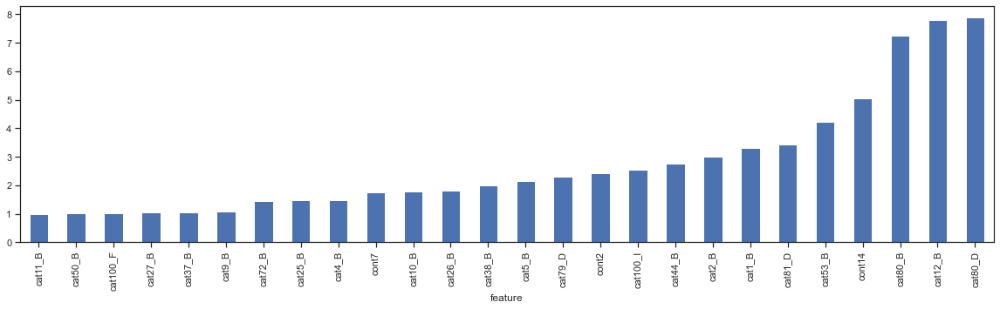

In [209]:
fig = plt.figure(figsize=(20, 5))
pd.Series(coef_pos['coef_values']).sort_values().plot(kind='bar');

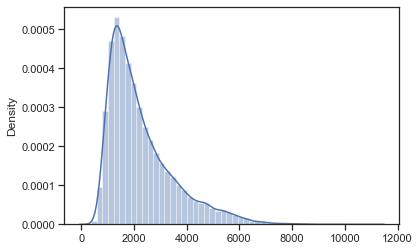

In [210]:
test_pred = catboost.predict(X_test)
test_pred = test_pred - 1
test_pred = np.exp(test_pred)
sns.distplot(test_pred);

<h2>&#9635; Using the model</h2>
<p>Use select model in test dataset provide with train test</p>

In [135]:
#read test dataset
claim_test_raw = pd.read_csv('test.csv', sep =',')
claim_test_raw.head()

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,...,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14
0,4,A,B,A,A,A,A,A,A,B,...,0.281143,0.466591,0.317681,0.61229,0.34365,0.38016,0.377724,0.369858,0.704052,0.392562
1,6,A,B,A,B,A,A,A,A,B,...,0.836443,0.482425,0.443760,0.71330,0.51890,0.60401,0.689039,0.675759,0.453468,0.208045
2,9,A,B,A,B,B,A,B,A,B,...,0.718531,0.212308,0.325779,0.29758,0.34365,0.30529,0.245410,0.241676,0.258586,0.297232
3,12,A,A,A,A,B,A,A,A,A,...,0.397069,0.369930,0.342355,0.40028,0.33237,0.31480,0.348867,0.341872,0.592264,0.555955
4,15,B,A,A,A,A,B,A,A,A,...,0.302678,0.398862,0.391833,0.23688,0.43731,0.50556,0.359572,0.352251,0.301535,0.825823


In [133]:
claim_test_raw.shape

(125546, 131)

In [ ]:
claim_test_raw

In [139]:
#prepare dataset to feed the model
claim_test = claim_test_raw.copy()
claim_test = claim_test.drop(columns =['id'])
#Get dummy data
claim_test_dummies = pd.get_dummies(claim_test, columns = categorical_columns,drop_first=True)
claim_test_dummies.head()

,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,...,cat116_MW,cat116_MX,cat116_N,cat116_O,cat116_Q,cat116_R,cat116_S,cat116_T,cat116_U,cat116_Y
0,0.321594,0.299102,0.246911,0.402922,0.281143,0.466591,0.317681,0.61229,0.34365,0.38016,...,0,0,0,0,0,0,0,0,0,0
1,0.634734,0.620805,0.654310,0.946616,0.836443,0.482425,0.443760,0.71330,0.51890,0.60401,...,0,0,0,0,0,0,0,0,0,0
2,0.290813,0.737068,0.711159,0.412789,0.718531,0.212308,0.325779,0.29758,0.34365,0.30529,...,0,0,0,0,0,0,0,0,0,0
3,0.268622,0.681761,0.592681,0.354893,0.397069,0.369930,0.342355,0.40028,0.33237,0.31480,...,0,0,0,0,0,0,0,0,0,0
4,0.553846,0.299102,0.263570,0.696873,0.302678,0.398862,0.391833,0.23688,0.43731,0.50556,...,0,0,0,0,0,0,0,0,0,0


<h1 style="color:red;">&#9888;</h1>
<p>Model will not work on this dataset becuase it has less variables than model train, maybe some categories where delete when subset q95 was performed, so further analysis should be done in order to clean dataset and macth same variables by name and number</p>  

<h2>&#9635; Model Interpretation</h2>
<h3>&#9733; LIME</h3>

In [42]:
from lime.lime_tabular import LimeTabularExplainer

In [43]:
explainer = LimeTabularExplainer(X_train.values,
                                 feature_names=X_train.columns.values,
                                 class_names=['loss'],
                                 verbose=True, 
                                 mode='regression')

In [48]:
# Pick a claim we want to analyze
claim_index = 3417

# Get the explanation from the black box model
exp = explainer.explain_instance(X_test.iloc[claim_index], catboost.predict,num_features=10)

# Display the explanation
exp.show_in_notebook()

Intercept 9.562126996255945
Prediction_local [8.66379997]
Right: 9.434897650216982


In [49]:
# Pick a claim we want to analyze
claim_index = 10619

# Get the explanation from the black box model
exp = explainer.explain_instance(X_test.iloc[claim_index], catboost.predict,num_features=10)

# Display the explanation
exp.show_in_notebook()

Intercept 8.420430505244731
Prediction_local [8.6565795]
Right: 8.882345794608826


<h3>Extra</h3>
<h2>&#9635; Gamma Regression (GLM)</h2>
<p>The generalized linear model with gamma distribution is the first choice of techniques among actuaries and analytics professionals while modeling claim severity.</p>

In [22]:
#Retreive information for q95 save in earlier stage
claims_raw_q95 = pd.read_csv('claims_raw_q95.csv')
claims_raw_q95

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,...,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
0,1,A,B,A,B,A,A,A,A,B,...,0.718367,0.335060,0.30260,0.67135,0.83510,0.569745,0.594646,0.822493,0.714843,2213.18
1,2,A,B,A,A,A,A,A,A,B,...,0.438917,0.436585,0.60087,0.35127,0.43919,0.338312,0.366307,0.611431,0.304496,1283.60
2,5,A,B,A,A,B,A,A,A,B,...,0.289648,0.315545,0.27320,0.26076,0.32446,0.381398,0.373424,0.195709,0.774425,3005.09
3,10,B,B,A,B,A,A,A,A,B,...,0.440945,0.391128,0.31796,0.32128,0.44467,0.327915,0.321570,0.605077,0.602642,939.85
4,11,A,B,A,B,A,A,A,A,B,...,0.178193,0.247408,0.24564,0.22089,0.21230,0.204687,0.202213,0.246011,0.432606,2763.85
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
178897,587620,A,B,A,A,A,A,A,A,B,...,0.242437,0.289949,0.24564,0.30859,0.32935,0.223038,0.220003,0.333292,0.208216,1198.62
178898,587624,A,A,A,A,A,B,A,A,A,...,0.334270,0.382000,0.63475,0.40455,0.47779,0.307628,0.301921,0.318646,0.305872,1108.34
178899,587630,A,B,A,A,A,A,A,B,B,...,0.345883,0.370534,0.24564,0.45808,0.47779,0.445614,0.443374,0.339244,0.503888,5762.64
178900,587632,A,B,A,A,A,A,A,A,B,...,0.704364,0.562866,0.34987,0.44767,0.53881,0.863052,0.852865,0.654753,0.721707,1562.87


In [23]:
#Prepare data, no log transformation
loss = claims_raw_q95_dummies['loss']
claims = claims_raw_q95_dummies.drop(columns = ['id','loss']) 

In [25]:
#Splitting data
X_train, X_test, y_train, y_test = train_test_split(claims,loss, test_size = 0.25, random_state=1988)
print("X_train shape is: {}".format(X_train.shape))
print("y_train shape is: {}".format(y_train.shape))
print("X_test shape is: {}".format(X_test.shape))
print("y_test shape is: {}".format(y_test.shape))

X_train shape is: (134176, 1022)
y_train shape is: (134176,)
X_test shape is: (44726, 1022)
y_test shape is: (44726,)


In [26]:
import xgboost as xgb
# for gamma regression, we need to set the objective to 'reg:gamma', it also suggests
# to set the base_score to a value between 1 to 5 if the number of iteration is small
param = {'objective':'reg:gamma', 'booster':'gbtree', 'base_score':3}

In [27]:
# Train and test have to be set as DMatrix
data_train = xgb.DMatrix(X_train, label=y_train)
data_test = xgb.DMatrix(X_test, label=y_test)

In [28]:
#Build a watch list
watchlist = [(data_test, 'eval'), (data_train, 'train')]
num_round = 30

In [29]:
# training and evaluation
bst = xgb.train(param, data_train, num_round, watchlist)
preds = bst.predict(data_test)
labels = data_test.get_label()
print('test deviance=%f' % (2 * np.sum((labels - preds) / preds - np.log(labels) + np.log(preds))))

[0]	eval-gamma-nloglik:633.09021	train-gamma-nloglik:634.82495
[1]	eval-gamma-nloglik:469.88754	train-gamma-nloglik:471.17322
[2]	eval-gamma-nloglik:349.06284	train-gamma-nloglik:350.01468
[3]	eval-gamma-nloglik:259.63089	train-gamma-nloglik:260.33655
[4]	eval-gamma-nloglik:193.45494	train-gamma-nloglik:193.97865
[5]	eval-gamma-nloglik:144.50797	train-gamma-nloglik:144.89574
[6]	eval-gamma-nloglik:108.32404	train-gamma-nloglik:108.61150
[7]	eval-gamma-nloglik:81.59470	train-gamma-nloglik:81.80753
[8]	eval-gamma-nloglik:61.86901	train-gamma-nloglik:62.02666
[9]	eval-gamma-nloglik:47.33094	train-gamma-nloglik:47.44793
[10]	eval-gamma-nloglik:36.63534	train-gamma-nloglik:36.72224
[11]	eval-gamma-nloglik:28.78516	train-gamma-nloglik:28.84959
[12]	eval-gamma-nloglik:23.04116	train-gamma-nloglik:23.08934
[13]	eval-gamma-nloglik:18.85618	train-gamma-nloglik:18.89200
[14]	eval-gamma-nloglik:15.82330	train-gamma-nloglik:15.84987
[15]	eval-gamma-nloglik:13.64072	train-gamma-nloglik:13.66056
[16]

In [31]:
print("MAE is: {}".format(mean_absolute_error(labels,preds)))
print("MSE is: {}".format(mean_squared_error(labels,preds)))
print("R2 score is: {}".format(r2_score(labels, preds)))

MAE is: 1036.6962890625
MSE is: 2035718.625
R2 score is: 0.3867631449505283


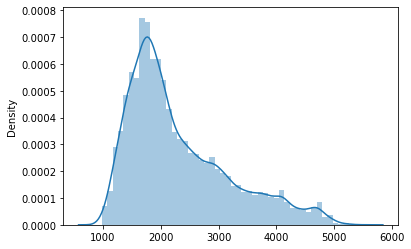

In [32]:
sns.distplot(preds);